In [1]:
import cv2
import imageio
import numpy as np
import os
from pylab import *
import scipy
from scipy import ndimage
import skimage
from skimage import color, exposure, filters, img_as_float
from skimage.morphology import binary_dilation, disk
from skimage.transform import hough_line, hough_line_peaks
from skimage.draw import line
import time

%matplotlib inline

image_path = "../sekvence/"

# Napomena

# Zadatak 1

In [2]:
def remove_car(mask, p, show_steps=False):
    """
    Opis funkcije:
        Na binarzivanoj slici se posmatra najveći region koji čine
        beli pikseli povezani u 8-susedstvu. Najveći region se izdvaja,
        formira se kvadratna maska i u povratnoj vrednosti funkcije
        čuvaju se neophodne informacije za uklanjanje najvećeg regiona.
        
    Ulazni argumenti:
        mask:
            Binarizovana slika
        p:
            Broj piksela za koji se proširuje maska izdvojenog regiona
        show_steps:
            Bool promenljiva za prikaz međurezultata (opcioni argument)
            
    Izlazni argumenti:
        square_seg_mask:
            Binarna maska izdvojenog regiona
        next_row:
            Prvi naredni red nakon izdvojenog segmenta
        prev_col:
            Prva kolona pre izdvojenog segmenta
        next_col:
            Prva kolona nakon izdvojenog segmenta
            
    """
    
    # Dimenzije ulazne slike
    M, N = mask.shape
    
    # Nizovi indeksa pomoću kojih će se čuvati koordinate
    ind_rows = np.arange(0,M)
    ind_cols = np.arange(0,N)
    
    # Vrste i kolone u kojima se nalaze pikseli sa vrednošću 1
    rows = np.any(mask, axis=1)
    
    # Brojač segmenata
    seg_num = 1
    
    # Matrica segmenata
    segment_matrix = np.zeros((M+1,N+2), dtype=int)
    
    # Prolazak kroz sve vrste koje sadrže bar jedan ivični piksel
    for r in ind_rows[rows]:
        # Prolazak kroz sve kolone koje sadrže ivični piksel u trenutnom redu
        for c in ind_cols[mask[r,:] == 1]:
            # Lista dodeljenih segmenata pikselimo levo, gore-levo, gore i gore-desno
            sur_segments = np.array([segment_matrix[r+1,c], segment_matrix[r,c], \
                                    segment_matrix[r,c+1], segment_matrix[r,c+2]])
            
            sur_segments = sur_segments[sur_segments != 0]

            # Da li je lista okolnih segmenata prazna?
            if(np.size(sur_segments)==0):
                segment_matrix[r+1,c+1] = seg_num
                seg_num += 1
            else:
                # Izdvajanje svih okolnih segmenata koji će nakon ovog koraka postati jednaki
                set_of_sur_segments = set(sur_segments)
                # Segment sa minimalnim brojem
                min_seg = min(set_of_sur_segments)
                # Uklanjanje izdvojenog segmenta
                set_of_sur_segments.remove(min_seg)
                # Svakom od preostalih segmenata se dodeljuje vrednost minimalnog
                for seg in set_of_sur_segments:
                    segment_matrix[segment_matrix==seg] = min_seg
                # Trenutni piksel se takođe dodeljuje izdvojenom segmentu
                segment_matrix[r+1,c+1] = min_seg
                
    # Izdvajanje matrice segmenata
    pixels_center = segment_matrix[1::,1:-1]
    
    # Formiranje skupa segmenata
    set_of_segments = set(pixels_center[pixels_center!=0])
    
    # Iterator segmenata se inicijalizuje
    seg_num = 0
    
    # Velicina regiona
    region_size = []
    max_region_size = 0
    max_region_ind = 0
    
    # Za svaki od odeljeni segment, dodeljuje mu se nova vrednost u osegu 0-broj_segmenata
    for element in set_of_segments:
        seg_num += 1
        # Dodeljuje se negativna vrednost kako ne bi došlo do preklapanja
        pixels_center[pixels_center==element] = -seg_num
        
        # Veličina regiona
        cur_region_size = sum(pixels_center == -seg_num)
        
        # Ukoliko je veličina veća od maksimalne zabeležene, pamti se broj segmenta
        if(cur_region_size > max_region_size):
            max_region_ind = seg_num
            max_region_size = cur_region_size
            
        # Dodavanje veličine segmenta u listu
        region_size.append(cur_region_size)
        
        
    # Realne vrednosti segmenata se dobijaju negacijom
    pixels_center = -pixels_center
    
    
    # Vrste i kolone koje sadrže najveći segment
    segment_rows = ind_rows[np.any(pixels_center==max_region_ind, axis=1)]
    segment_cols = ind_cols[np.any(pixels_center==max_region_ind, axis=0)]
    
    # Početne i krajnje vrste i kolone
    first_row = segment_rows[0]
    last_row = segment_rows[-1]
    first_col = segment_cols[0]
    last_col = segment_cols[-1]
    
    # Kreiranje kvadratne maske izdvojenog regiona
    square_seg_mask = np.zeros((M,N), dtype=bool)
    square_seg_mask[max(0,first_row-p):min(last_row+p,M),max(0,first_col-p):min(last_col+p,N)] = True
    
    # Prva naredna vrsta
    next_row = min(last_row + 1, M-1)
    # Prethodna kolona
    prev_col = max(0, first_col - 1)
    # Naredna kolona (+2 zbog kasnijeg indeksiranja)
    next_col = min(last_col + 2, N-1)
    
    # Prikaz međurezultata
    if(show_steps):
        print("--------------------------------------------------------------------------------")
        print("---------------------- Otklanjanje najvećeg belog regiona  ---------------------")
        print("--------------------------------------------------------------------------------")

        
        fig, axes = plt.subplots(ncols=2, figsize=(8,14), dpi=120)
        ax = axes.ravel()
        ax[0].imshow(mask, cmap='gray')
        ax[0].set_title("Binarizovana slika belih oblasti")
        ax[0].set_axis_off()
        ax[1].imshow(square_seg_mask, cmap='gray')
        ax[1].set_title("Pravougaona maska najveceg belog regiona")
        ax[1].set_axis_off()
        plt.tight_layout()
        plt.show()
        
    
    return square_seg_mask, next_row, prev_col, next_col


def remove_sky(image_hsv, show_steps=False):
    """
    Opis funkcije:
        Funkcija za uklanjanje piksela koji pripadaju nebu. Na osnovu
        H komponente HSV kolor sistema se posmatra srednja vrednost
        piksela u predefinisanoj vrsti i rasponu kolona. Izdvaja se
        binarna maska piksela koji pripadaju opsegu vrednosti H 
        pomponente sa određenom tolerancijom.
        
    Ulazni argumenti:
        image_hsv:
            Slika u HSV kolor sistemu
        show_stps:
            Bool vrednost za prikaz međurezultata (opcioni argument)
            
    Izlazni argumenti:
        square_sky:
            Binarna maska izdvojenog neba
    """   
    
    # Dimenzije slike
    M, N, C = image_hsv.shape
    
    # Indeks vrste i opseg kolona u kojem se proveravaju pikseli neba
    indr = 10
    indc = [N//3, 2*N//3]
    
    # Srednje vrednosti H komponente na vrhu slike
    Hmean = np.mean(image_hsv[indr,indc[0]:indc[1],0])
    
    # Tolerancija srednje vrednosti H komponente
    tolerancy = 0.05
    
    # Opseg potiskivanja
    Hlt = Hmean - tolerancy
    Hht = Hmean + tolerancy
    
    # Maska piksela koji se nalaze u definsanom opsegu
    mask = (image_hsv[:,:,0] > Hlt) & (image_hsv[:,:,0] < Hht)
    
    # Izdvajanje svih vrsta pod uslovom da jediničnih piksela ima više od jedne desetine
    rows = np.sum(mask, axis=1) > N//10
    
    # Indeksi vrsta
    row_ind = np.arange(0,M)
    
    # Indeksi vrsta koji ne ispunjavaju uslov
    false_rows = row_ind[(rows == False)]
    
    # Prva vrsta za koju uslov nije ispunjen
    first_false = false_rows[0]
    
    # Pravougaona maska neba
    square_sky = np.zeros((M,N), dtype=bool)
    square_sky[0:first_false,:] = True
    
    # Prikaz međurezultata
    if(show_steps):
        print("--------------------------------------------------------------------------------")
        print("---------------------------- Izdvajanje maske neba  ----------------------------")
        print("--------------------------------------------------------------------------------")

        
        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8,14), dpi=120)
        ax = axes.ravel()
        ax[0].imshow(mask, cmap='gray')
        ax[0].set_title("Binarizovana H komponenta")
        ax[0].set_axis_off()
        ax[1].imshow(square_sky, cmap='gray')
        ax[1].set_title("Maska izdvojenog neba")
        ax[1].set_axis_off()
        plt.tight_layout()
        plt.show()
    
    return square_sky
    

def extract_yellow_lane(image, image_hsv, show_steps=False):
    """
    Opis funkcije:
        Funkcija za izdvajanje žutih linija na putu na osnovu
        kolor sistema. Korišćene su sve tri komponente HSV kolor
        sistema kao i B komponenta RGB kolor sistema. Poređenjem
        sa unapred određenim pragom i operacijom "i" dobijenih
        maski, dobija se maska segmentacije.
        
    Ulazni argumenti:
        image:
            Slika sa koje se izdvajaju linije
        image_hsv:
            Slika u HSV kolor sistemu
        show_stps:
            Bool vrednost za prikaz međurezultata (opcioni argument)
            
    Izlazni argumenti:
        mask:
            Binarna maska izdvojene žute linije
    """   

    # Podaci o dimenzijama slike
    M, N, C = image.shape
    
    # Definisanje pragova komponenti
    Hlt = 0.10 # Donji prag H komponente
    Hht = 0.14 # Gornji prag H komponente
    Slt = 0.45 # Donji prag S komponente
    Sht = 0.9 # Gornji prag S komponente
    Vlt = 0.7 # Donji prag V komponente
    Bht = 0.6 # Gornji prag B komponente
    
    # Formiranje maske na osnovu definisanih pragova
    mask = (image_hsv[:,:,0]>Hlt) & (image_hsv[:,:,0]<Hht) & \
           (image_hsv[:,:,1]>Slt) & (image_hsv[:,:,1]<Sht) & \
           (image_hsv[:,:,2]>Vlt) & (image[:,:,2]    <Bht)
    
    # Prikaz međukoraka
    if(show_steps):
        print("--------------------------- Izdvajanje zutih linija  ---------------------------")
        print("--------------------------------------------------------------------------------")

        
        fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(10,4), dpi=120)
        ax = axes.ravel()
        # Prikaz H komponente HSV kolor sistema
        ax[0].imshow(image_hsv[:,:,0], cmap='jet')
        ax[0].set_axis_off()
        ax[0].set_title("H komponenta")
        ax[4].imshow((image_hsv[:,:,0]>Hlt) * (image_hsv[:,:,0]<Hht), cmap='gray')
        ax[4].set_axis_off()
        ax[4].set_title("H komponenta - maska")
        # Prikaz S komponente HSV kolor sistema
        ax[1].imshow(image_hsv[:,:,1], cmap='jet')
        ax[1].set_axis_off()
        ax[1].set_title("S komponenta")
        ax[5].imshow((image_hsv[:,:,1]>Slt) * (image_hsv[:,:,1]<Sht), cmap='gray')
        ax[5].set_axis_off()
        ax[5].set_title("S komponenta - maska")
        # Prikaz V komponente HSV kolor sistema
        ax[2].imshow(image_hsv[:,:,2], cmap='jet')
        ax[2].set_axis_off()
        ax[2].set_title("V komponenta")
        ax[6].imshow((image_hsv[:,:,2]>Vlt), cmap='gray')
        ax[6].set_axis_off()
        ax[6].set_title("V komponenta - maska")
        # Prikaz B komponente RGB kolor sistema
        ax[3].imshow(image[:,:,2], cmap='jet')
        ax[3].set_axis_off()
        ax[3].set_title("B komponenta")
        ax[7].imshow((image[:,:,2]<Bht), cmap='gray')
        ax[7].set_axis_off()
        ax[7].set_title("B komponenta - maska")
        plt.tight_layout()
        plt.show()

        
        # Prikaz originalne slike i binarne maske
        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8,6), dpi=120)
        ax = axes.ravel()
        ax[0].imshow(image)
        ax[0].set_axis_off()
        ax[0].set_title("Originalna slika")
        ax[1].imshow(mask, cmap='gray')
        ax[1].set_axis_off()
        ax[1].set_title("Konacna maska zutih regiona")
        plt.tight_layout()
        plt.show()

    
    return mask


def extract_white_lanes(image, image_hsv, show_steps=False):
    """
    Opis funkcije:
        Funkcija za izdvajanje belih linija na putu na osnovu
        kolor sistema. Unutar funkcije korišćene su S i V 
        komponente HSV kolor sistema, kao i RGB komponente
        velikih vrednosti. Nakon segmentacije na osnovu 
        kolor sistema izdvojen je najveći beli region pozivom
        funkcije remove_car i proveravano je da li se ispod
        izdvojenog segmenta nalaze crni pikseli. Ideja ovog
        postupka jeste da beo automobil ima crnu senku ispod
        sebe i na osnovu nje će se razlikovati od linija na putu.
        Ukoliko senka postoji ispod izdvojenog segmenta, region
        u obliku proširenog pravougaonika će se ukloniti.
        
    Ulazni argumenti:
        image: 
            Slika u boji sa koje se izdvajaju linije
        image_hsv:
            Slika u HSV kolor sistemu
        show_stps : 
            Bool vrednost za prikaz međurezultata (opcioni argument)
            
    Izlazni argumenti:
        mask:
            Binarna maska izdvojenih belih linija
    """

    # Podaci o dimenzijama slike
    M, N, C = image.shape
    
    # Definisanje pragova komponenti
    Sht = 0.2 # Gornji prag S komponente
    Vlt = 0.75 # Donji prag V komponente
    RGBwhite = 0.85 # Prag bele linije u RGB sistemu
    RGBblack = 0.1 # Prag crnog piksela u RGB sistemu
    

    # Formiranje maske na osnovu definisanih pragova
    mask = (image_hsv[:,:,1]<Sht) & \
           (image_hsv[:,:,2]>Vlt)
    
    
    
    # Izdvajanje regiona od interesa pomoću RGB kolor sistema
    mask_rgb_white = (image[:,:,0] > RGBwhite) & \
                     (image[:,:,1] > RGBwhite) & \
                     (image[:,:,2] > RGBwhite)

    
    # Objedinjavanje prethodno dobijenih maski
    mask = mask & mask_rgb_white
    
    # Izdvajanje najvećeg belog regiona
    largest_segment_mask, next_row, prev_col, next_col = remove_car(mask, 40, show_steps)
    
    # Tolerancija pri proveri crnih piksela
    tol = 20
    
    # Provera da li su u u narednom redu segmenta nalazi crni piksel (senka)
    erase = np.any(((image[next_row:(next_row+tol),prev_col:next_col,0] < RGBblack) & \
                    (image[next_row:(next_row+tol),prev_col:next_col,1] < RGBblack) & \
                    (image[next_row:(next_row+tol),prev_col:next_col,2] < RGBblack)))


    # Ako se u vrsti nalazi barem jedan crni piksel, vrstu treba obrisati (senka auta)
    if(erase):
        mask = mask & (~largest_segment_mask)
    
    
    # Prikaz međukoraka
    if(show_steps):
        print("--------------------------------------------------------------------------------")
        print("--------------------------- Izdvajanje belih linija  ---------------------------")
        print("--------------------------------------------------------------------------------")


        fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(8,4), dpi=120)
        ax = axes.ravel()
        # Prikaz S komponente HSV kolor sistema
        ax[0].imshow(image_hsv[:,:,1], cmap='jet')
        ax[0].set_axis_off()
        ax[0].set_title("S komponenta")
        ax[3].imshow((image_hsv[:,:,1]<Sht), cmap='gray')
        ax[3].set_axis_off()
        ax[3].set_title("S komponenta - maska")
        # Prikaz V komponente HSV kolor sistema
        ax[1].imshow(image_hsv[:,:,2], cmap='jet')
        ax[1].set_axis_off()
        ax[1].set_title("V komponenta")
        ax[4].imshow((image_hsv[:,:,2]>Vlt), cmap='gray')
        ax[4].set_axis_off()
        ax[4].set_title("V komponenta - maska")
        # Prikaz ukonjenog regiona
        ax[2].imshow(mask_rgb_white, cmap='gray')
        ax[2].set_axis_off()
        ax[2].set_title("Maska belih piksela (RGB)")
        ax[5].imshow(largest_segment_mask, cmap='gray')
        ax[5].set_axis_off()
        ax[5].set_title("Uklonjen najveci region? %s" %erase)
        plt.tight_layout()
        plt.show()
        
        
        # Prikaz originalne slike i finalne binarne maske
        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8,6), dpi=120)
        ax = axes.ravel()
        ax[0].imshow(image)
        ax[0].set_axis_off()
        ax[0].set_title("Originalna slika")
        ax[1].imshow(mask, cmap='gray')
        ax[1].set_axis_off()
        ax[1].set_title("Konacna maska belih regiona")
        plt.tight_layout()
        plt.show()

              
        
    return mask
    
    
    
def segment_lanes(img_in, show_steps=False):
    """
    Opis funkcije:
        Funkcija poziva pomoćne funkcije extract_yellow_lane i
        extract_white_lanes za izdvajanje žutih i belih linija
        na putu. Maska se objedinjuje logičkom operacijom "ili"
        i spaja u jedinstvenu masku. Množenjem dobijene maske sa
        svakom od komponenti slike, dobija se izdvojeni region
        od interesa. Dodatno, implementirana funkcija remove_sky
        se poziva na dobijenoj maski izdvojenih žutih i belih
        regiona i otklanja sve piksele koji pripadaju nebu služeći
        se HSV kolor sistemom.
        
    Ulazni argumenti:
        img_in:
            Ulazna slika u boji nad kojom se vrši segmentacija.
        show_steps:
            Bool vrednost za prikaz međurezultata (opcioni argument)
            
    Izlazni argumenti:
        img_out:
            Izlazna slika u boji sa izdvojenim regionima od interesa.
    """
    
    # Konverzija u HSV kolor sistem
    image_hsv = color.rgb2hsv(img_in)
    
    # Binarna maska izdvojene zute linije
    mask_yellow = extract_yellow_lane(img_in, image_hsv, show_steps)
    
    # Binarna maska izdvojenih belih linija
    mask_white = extract_white_lanes(img_in, image_hsv, show_steps)
    
    # Izdvajanje regiona u kojem se nalazi nebo
    mask_sky = remove_sky(image_hsv, show_steps)
    
    # Objedinjena binarna maska
    mask = (mask_yellow | mask_white) & (~mask_sky)
    
    # Izdvajanje regiona od interesa
    img_out = np.zeros_like(img_in)
    img_out[mask,:] = img_in[mask,:]
    
    # Prikaz konačnog rezultata
    if(show_steps):
        print("!-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.!")
        plt.figure(figsize=(12,12), dpi=120)
        plt.imshow(img_out)
        plt.title("Rezultat segmentacije")
        plt.axis('off')
        plt.show()        
        
    return img_out


## Prikaz međurezultata segmentacije na test slikama

--------------------------------------------------------------------------------
--------------------- Trenutno posmatrana slika: test1.jpg ---------------------
--------------------------------------------------------------------------------
--------------------------- Izdvajanje zutih linija  ---------------------------
--------------------------------------------------------------------------------


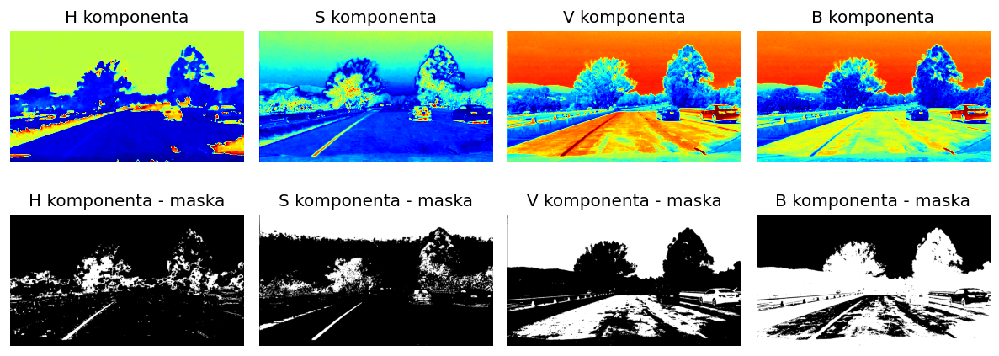

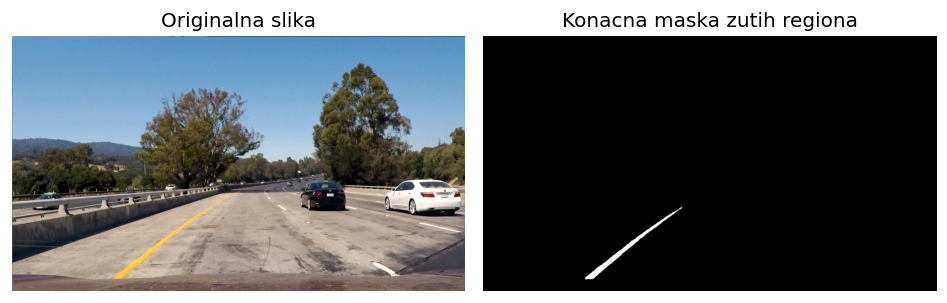

--------------------------------------------------------------------------------
---------------------- Otklanjanje najvećeg belog regiona  ---------------------
--------------------------------------------------------------------------------


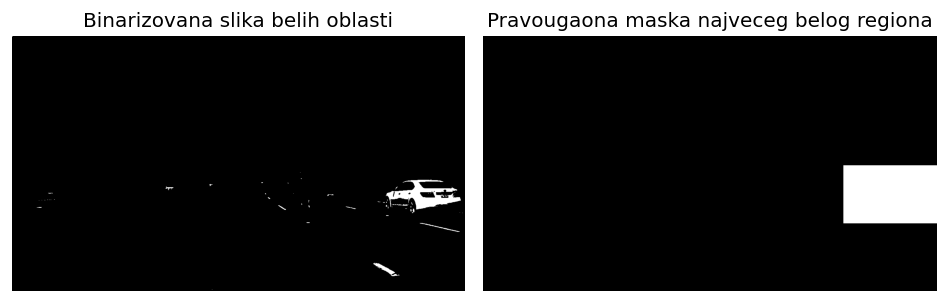

--------------------------------------------------------------------------------
--------------------------- Izdvajanje belih linija  ---------------------------
--------------------------------------------------------------------------------


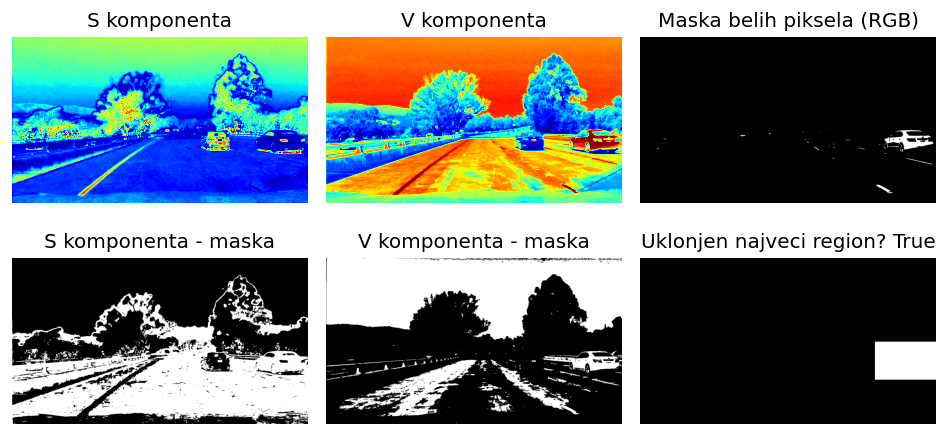

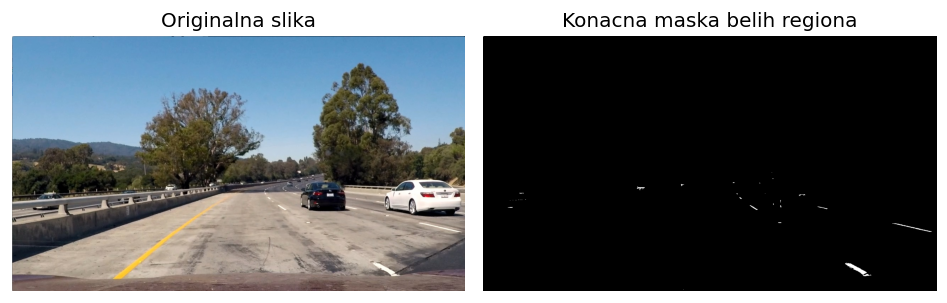

--------------------------------------------------------------------------------
---------------------------- Izdvajanje maske neba  ----------------------------
--------------------------------------------------------------------------------


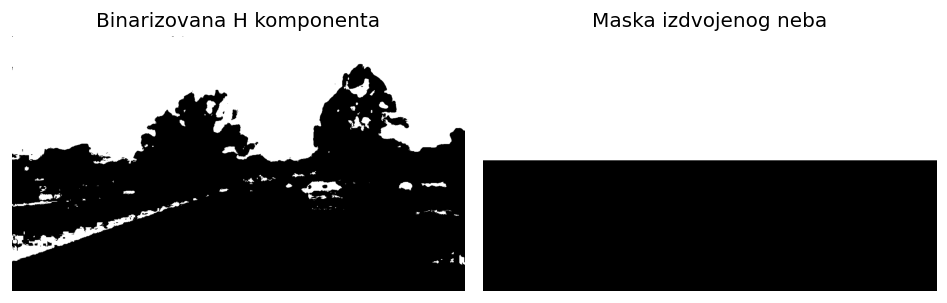

!-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.!


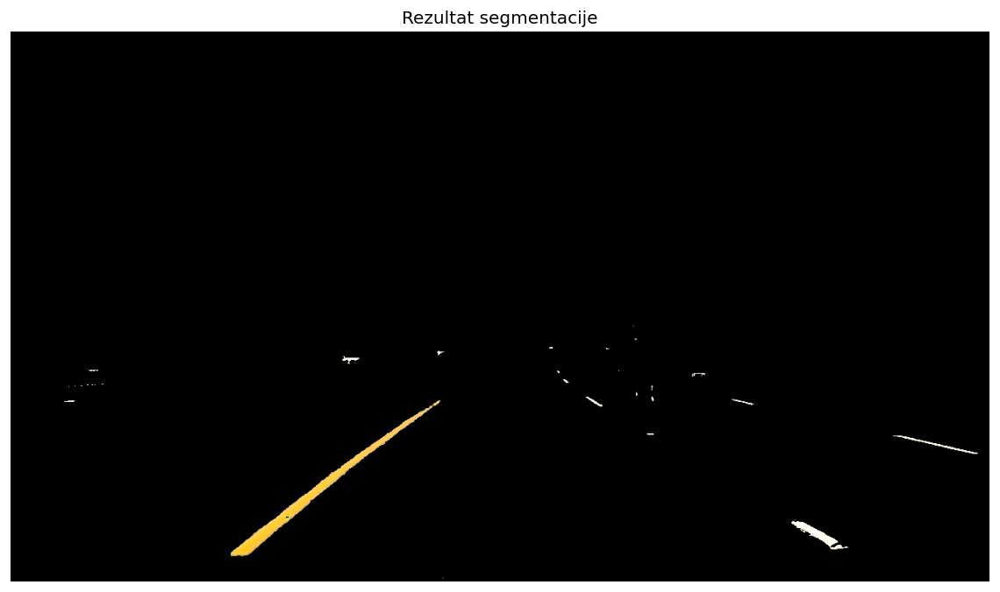

--------------------------------------------------------------------------------
--------------------- Trenutno posmatrana slika: test2.jpg ---------------------
--------------------------------------------------------------------------------
--------------------------- Izdvajanje zutih linija  ---------------------------
--------------------------------------------------------------------------------


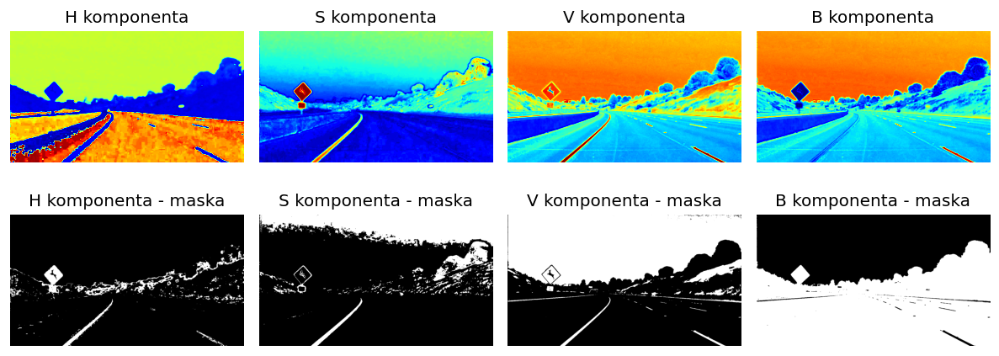

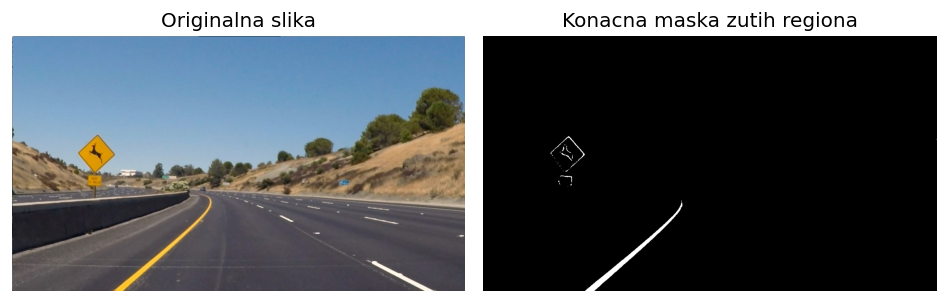

--------------------------------------------------------------------------------
---------------------- Otklanjanje najvećeg belog regiona  ---------------------
--------------------------------------------------------------------------------


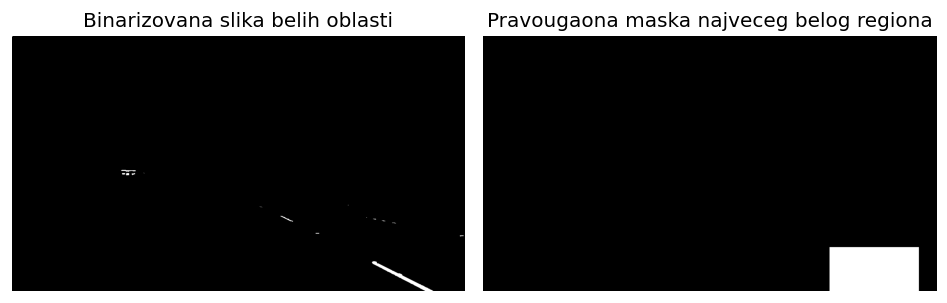

--------------------------------------------------------------------------------
--------------------------- Izdvajanje belih linija  ---------------------------
--------------------------------------------------------------------------------


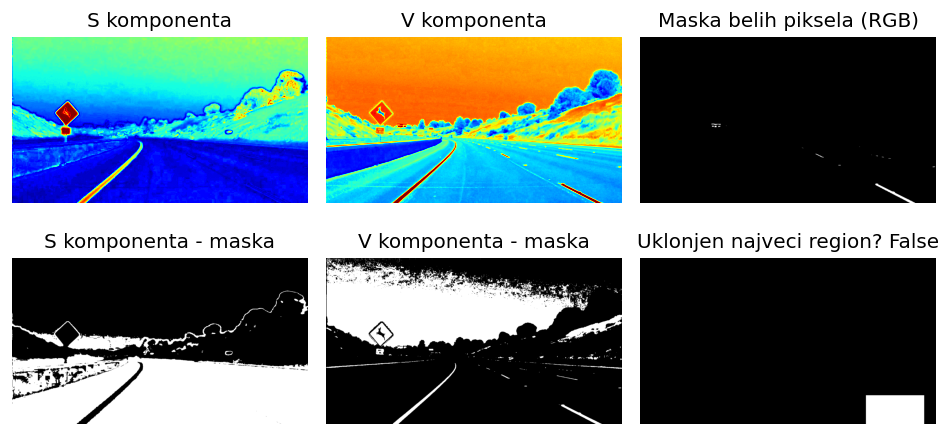

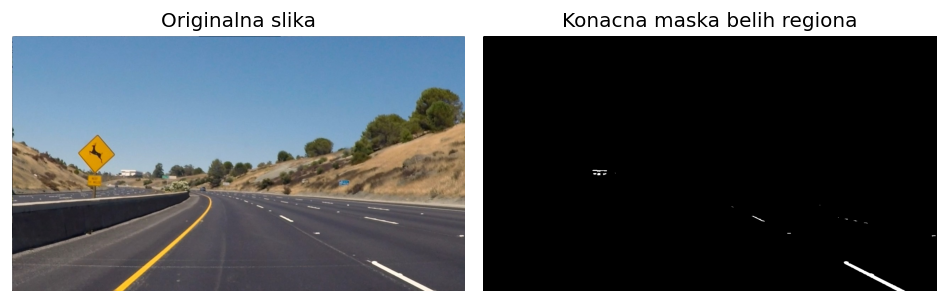

--------------------------------------------------------------------------------
---------------------------- Izdvajanje maske neba  ----------------------------
--------------------------------------------------------------------------------


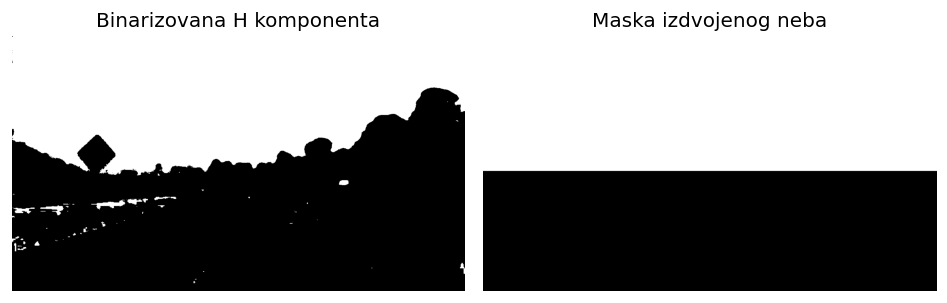

!-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.!


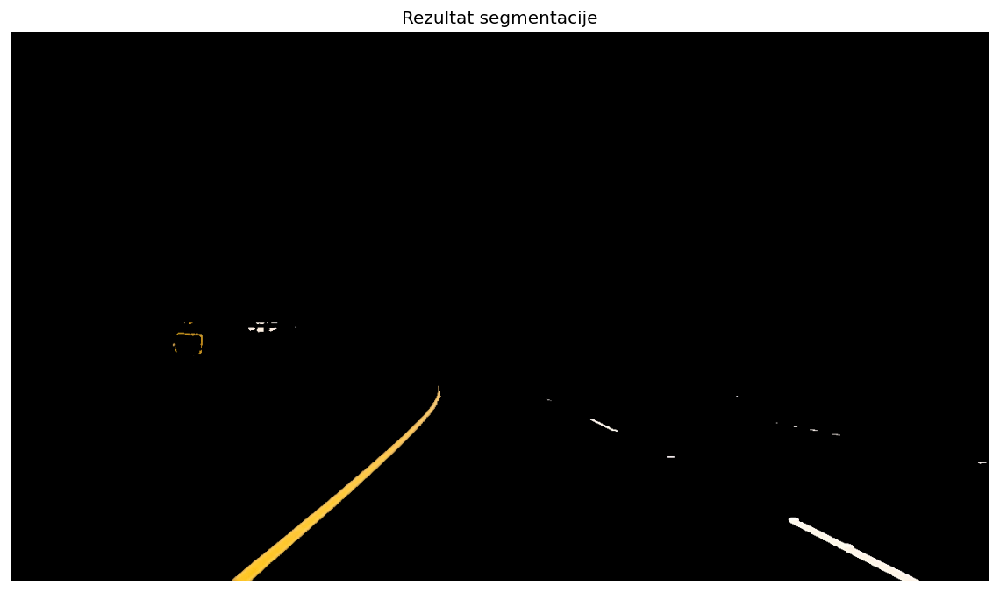

--------------------------------------------------------------------------------
--------------------- Trenutno posmatrana slika: test3.jpg ---------------------
--------------------------------------------------------------------------------
--------------------------- Izdvajanje zutih linija  ---------------------------
--------------------------------------------------------------------------------


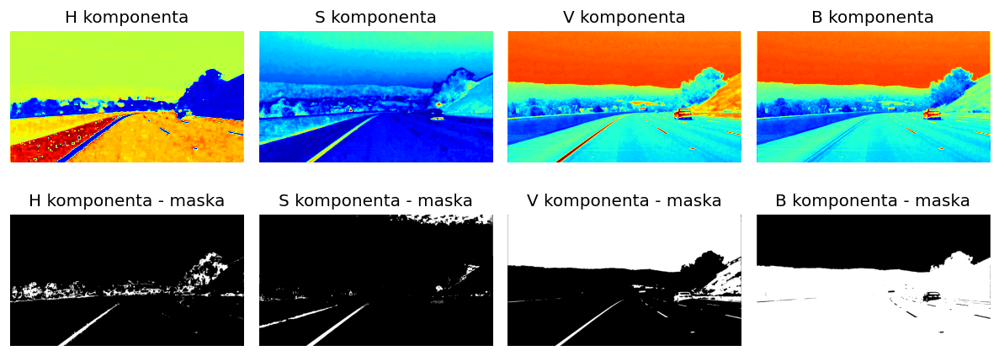

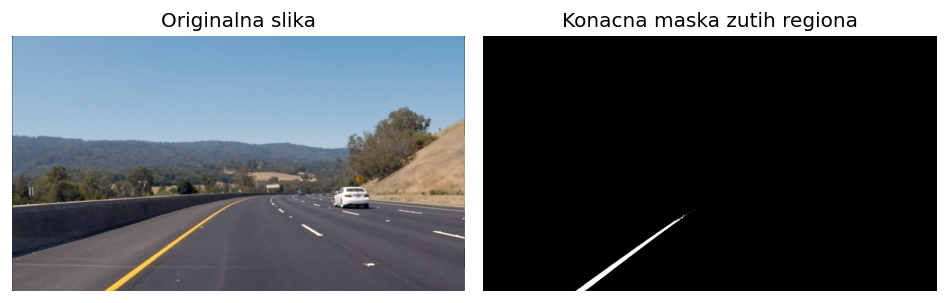

--------------------------------------------------------------------------------
---------------------- Otklanjanje najvećeg belog regiona  ---------------------
--------------------------------------------------------------------------------


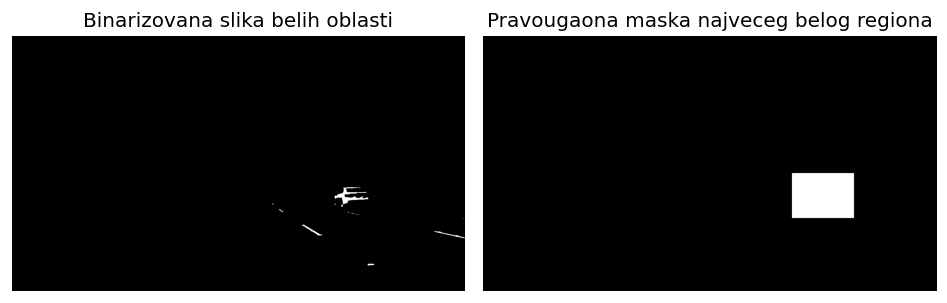

--------------------------------------------------------------------------------
--------------------------- Izdvajanje belih linija  ---------------------------
--------------------------------------------------------------------------------


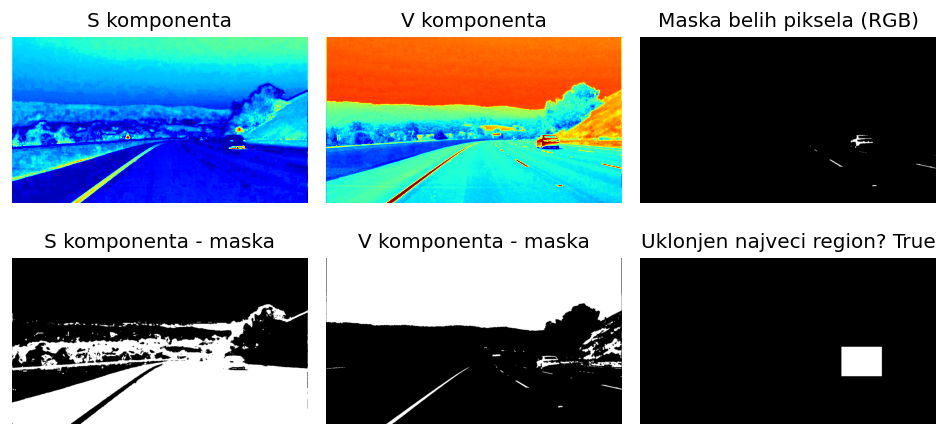

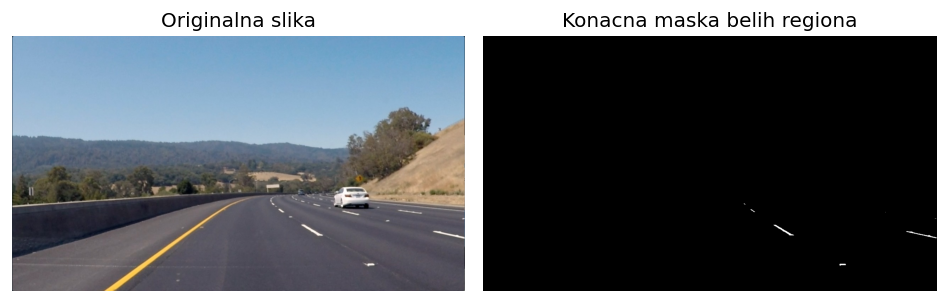

--------------------------------------------------------------------------------
---------------------------- Izdvajanje maske neba  ----------------------------
--------------------------------------------------------------------------------


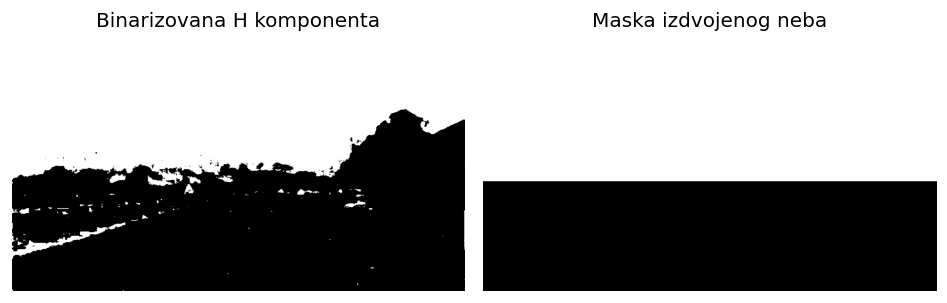

!-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.!


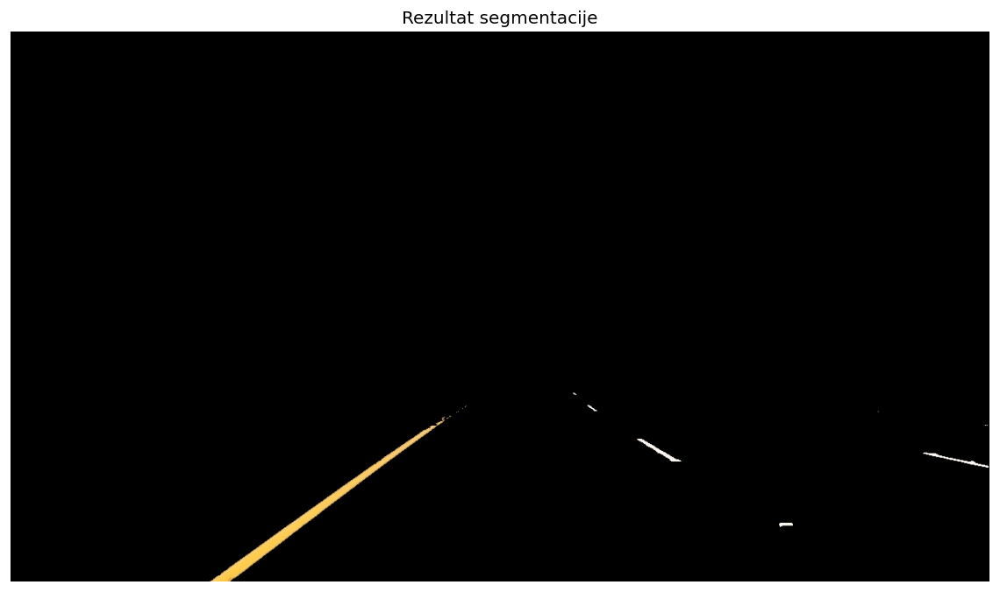

--------------------------------------------------------------------------------
--------------------- Trenutno posmatrana slika: test4.jpg ---------------------
--------------------------------------------------------------------------------
--------------------------- Izdvajanje zutih linija  ---------------------------
--------------------------------------------------------------------------------


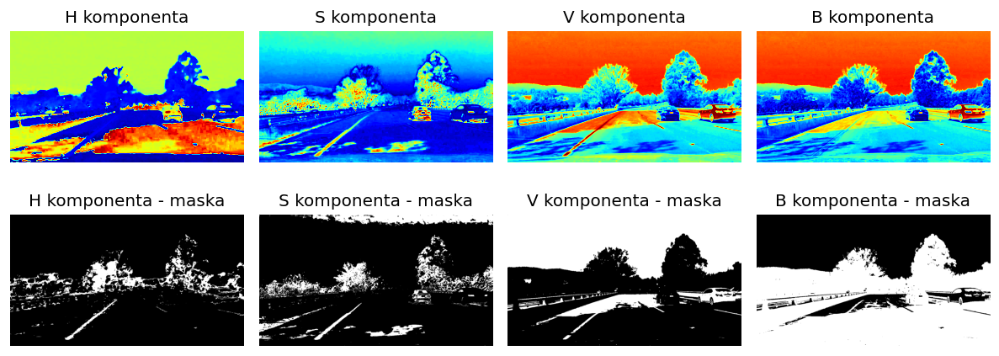

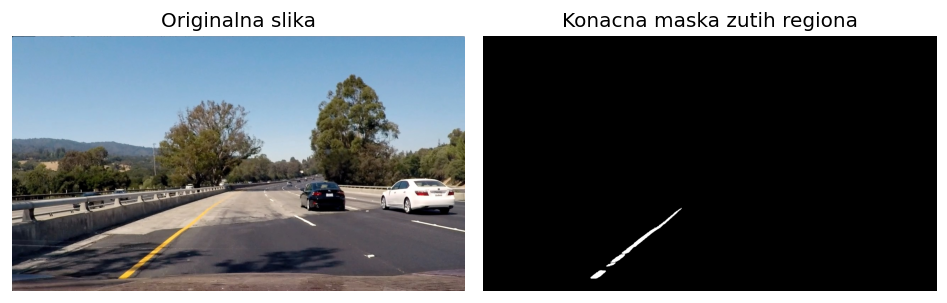

--------------------------------------------------------------------------------
---------------------- Otklanjanje najvećeg belog regiona  ---------------------
--------------------------------------------------------------------------------


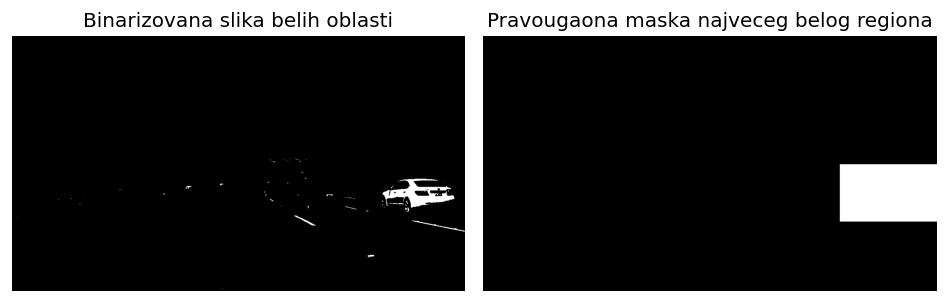

--------------------------------------------------------------------------------
--------------------------- Izdvajanje belih linija  ---------------------------
--------------------------------------------------------------------------------


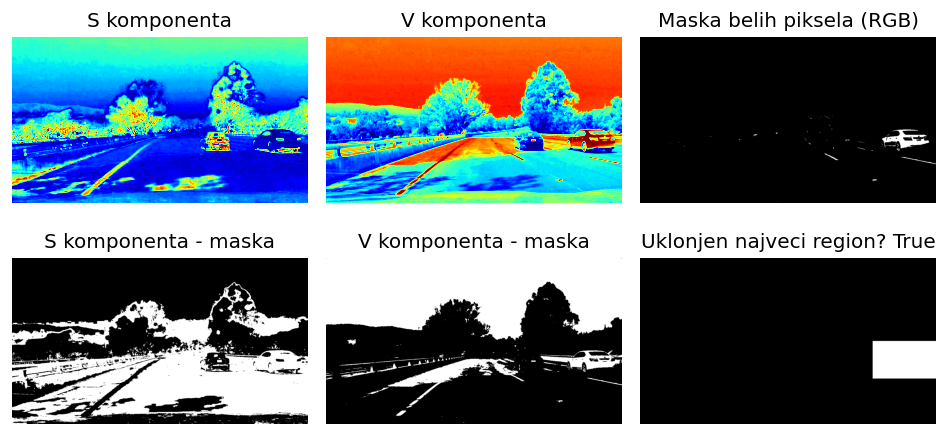

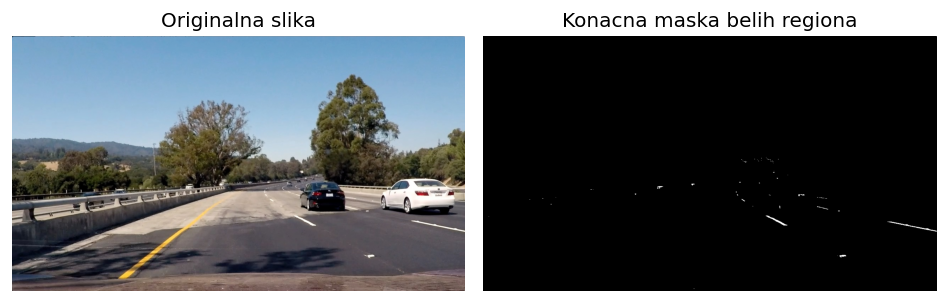

--------------------------------------------------------------------------------
---------------------------- Izdvajanje maske neba  ----------------------------
--------------------------------------------------------------------------------


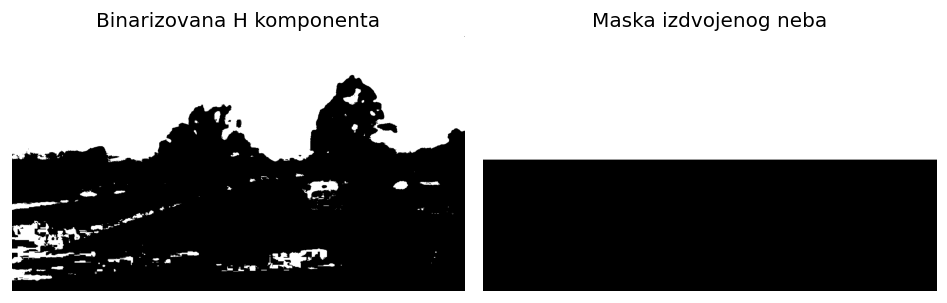

!-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.!


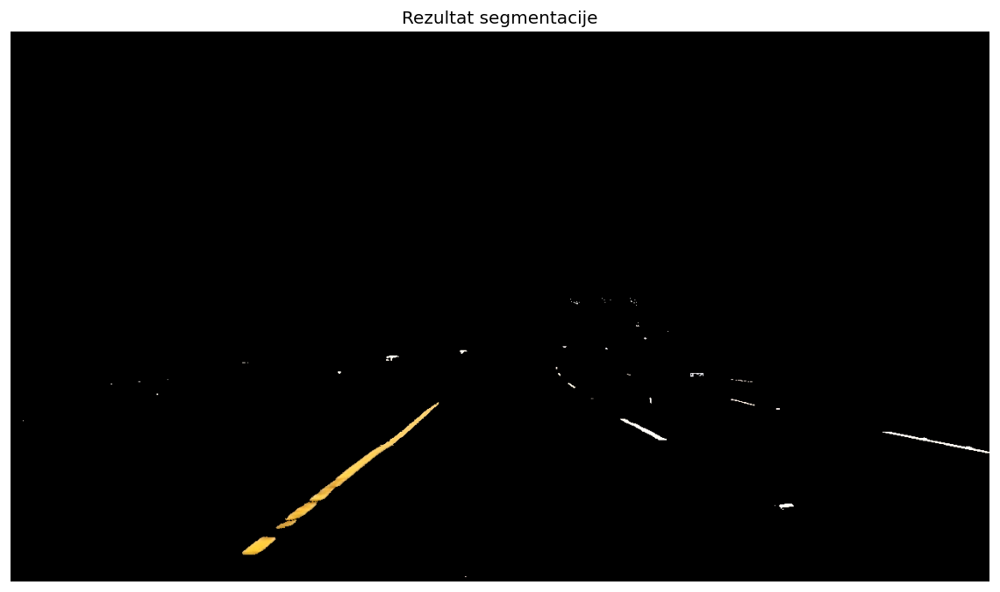

--------------------------------------------------------------------------------
--------------------- Trenutno posmatrana slika: test5.jpg ---------------------
--------------------------------------------------------------------------------
--------------------------- Izdvajanje zutih linija  ---------------------------
--------------------------------------------------------------------------------


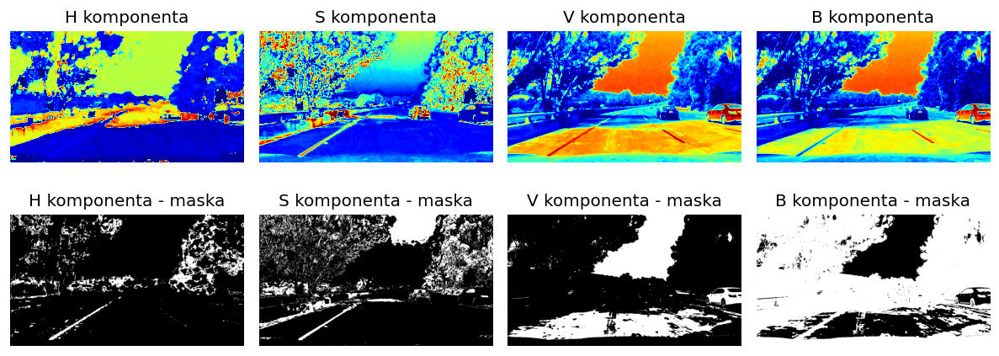

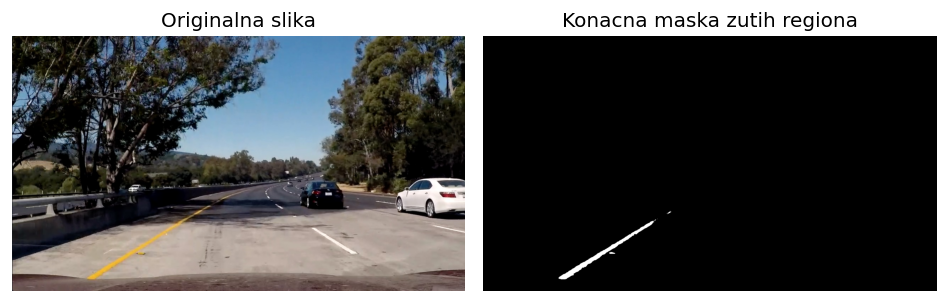

--------------------------------------------------------------------------------
---------------------- Otklanjanje najvećeg belog regiona  ---------------------
--------------------------------------------------------------------------------


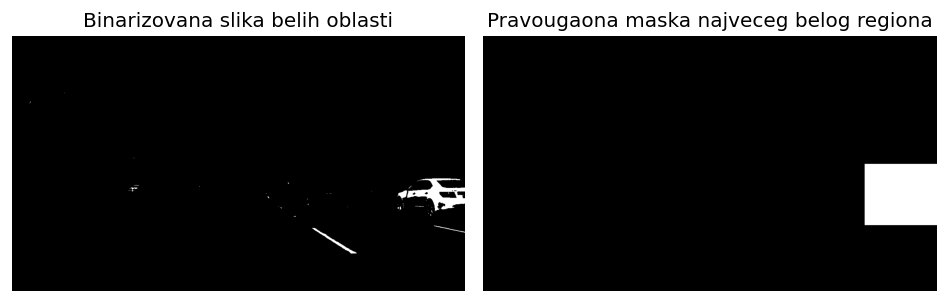

--------------------------------------------------------------------------------
--------------------------- Izdvajanje belih linija  ---------------------------
--------------------------------------------------------------------------------


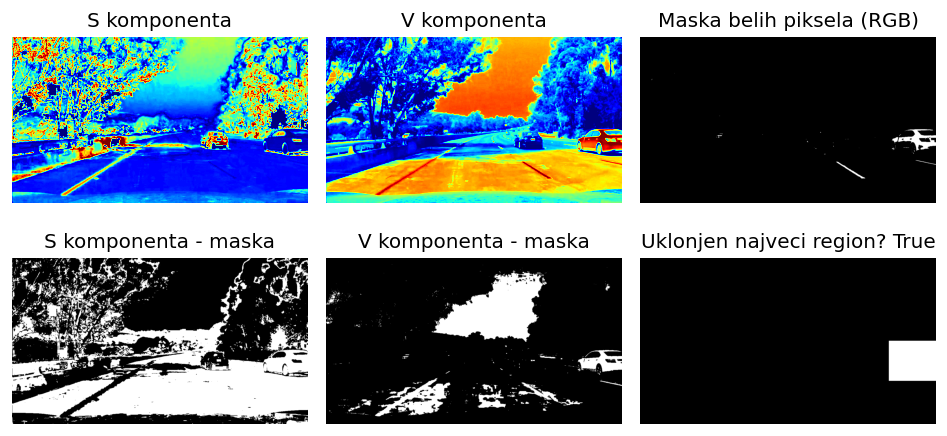

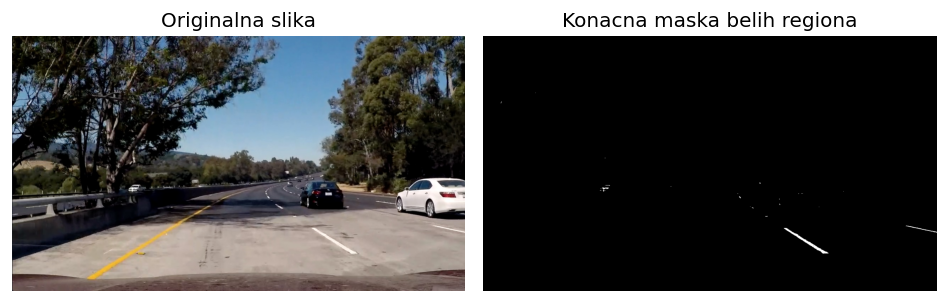

--------------------------------------------------------------------------------
---------------------------- Izdvajanje maske neba  ----------------------------
--------------------------------------------------------------------------------


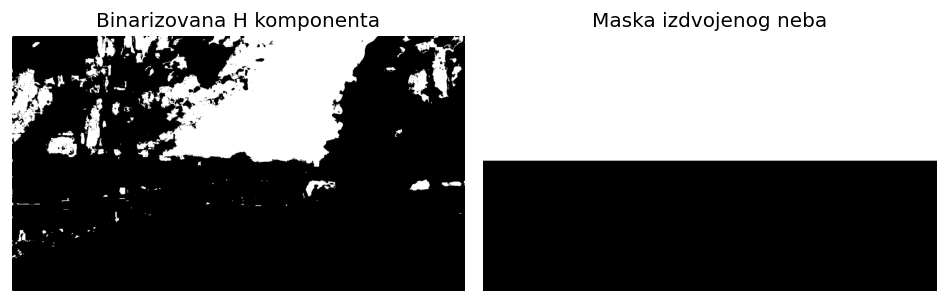

!-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.!


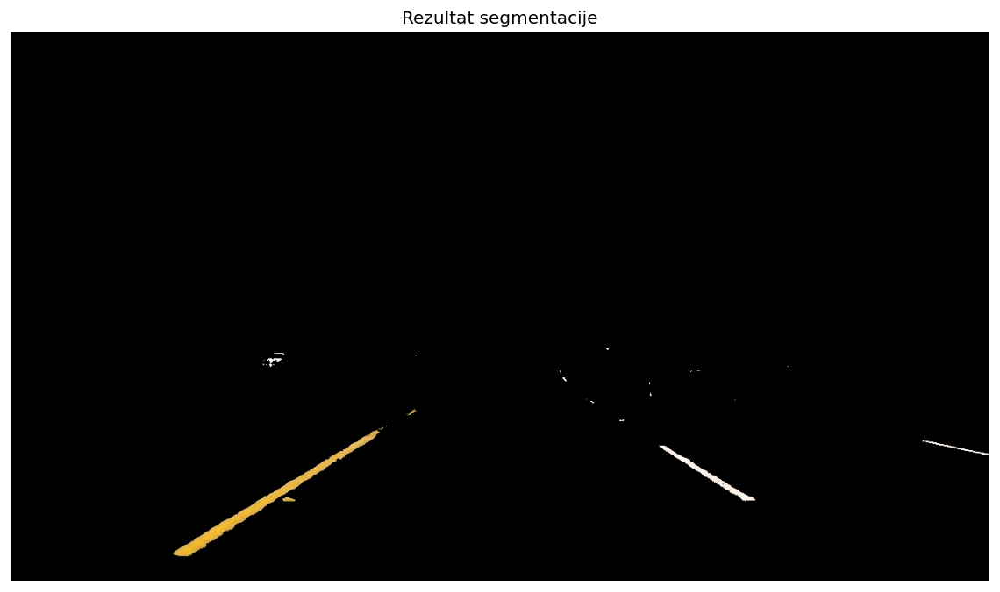

--------------------------------------------------------------------------------
--------------------- Trenutno posmatrana slika: test6.jpg ---------------------
--------------------------------------------------------------------------------
--------------------------- Izdvajanje zutih linija  ---------------------------
--------------------------------------------------------------------------------


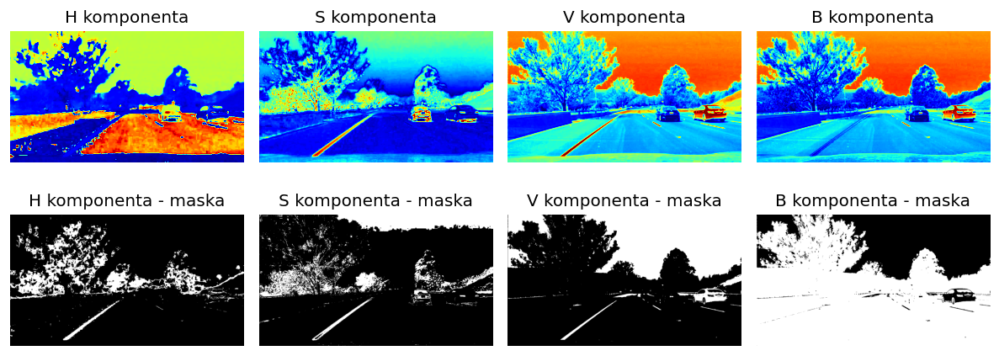

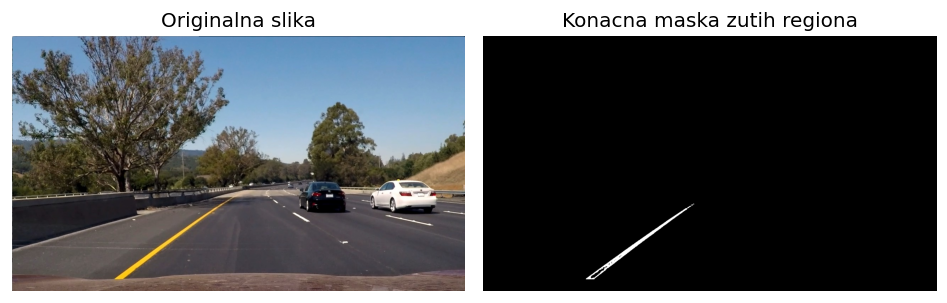

--------------------------------------------------------------------------------
---------------------- Otklanjanje najvećeg belog regiona  ---------------------
--------------------------------------------------------------------------------


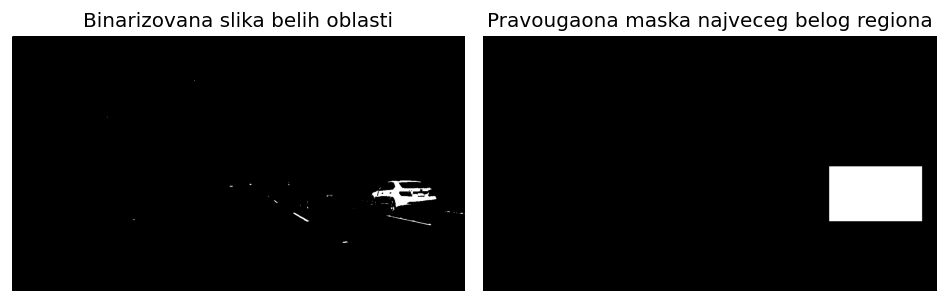

--------------------------------------------------------------------------------
--------------------------- Izdvajanje belih linija  ---------------------------
--------------------------------------------------------------------------------


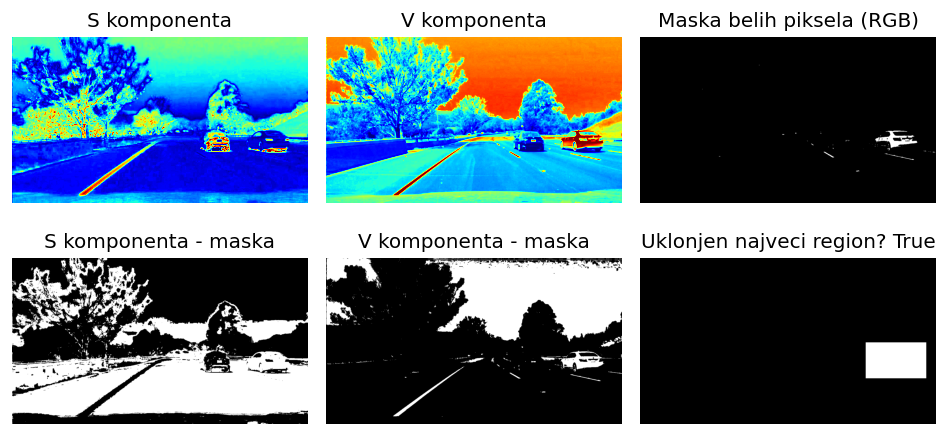

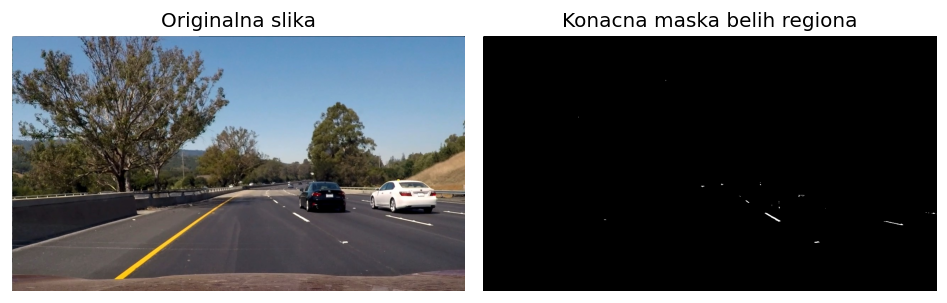

--------------------------------------------------------------------------------
---------------------------- Izdvajanje maske neba  ----------------------------
--------------------------------------------------------------------------------


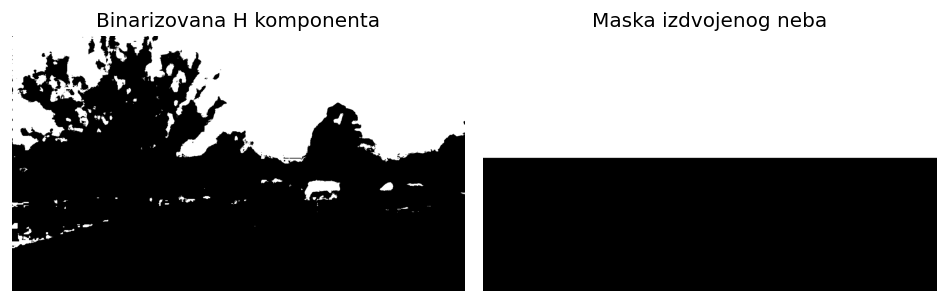

!-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.!


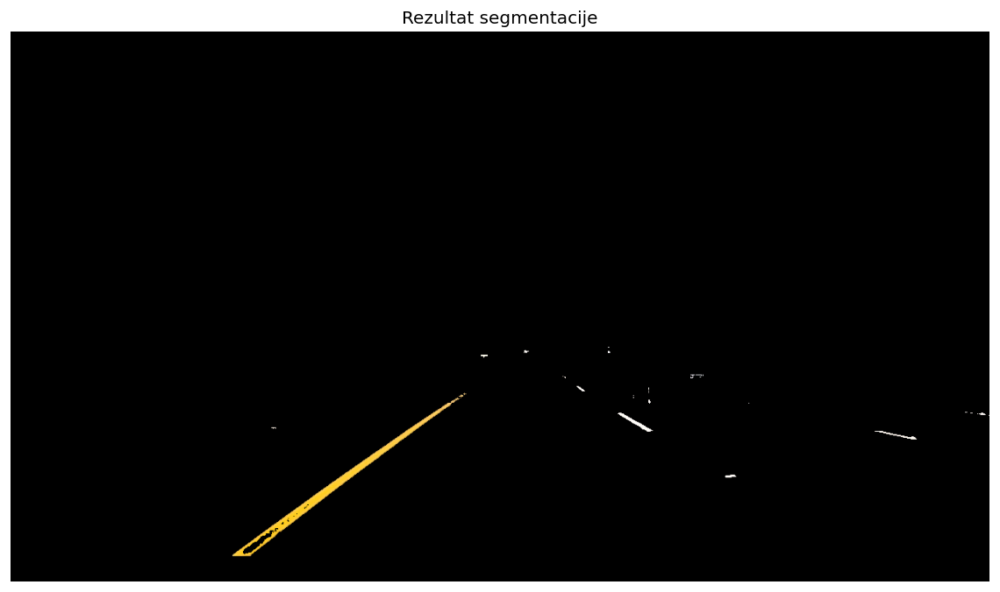

In [3]:
for i in range(1,7):
    
    # Formiranje naziva slike
    image_name = "test" + str(i) + ".jpg"
    
    print("--------------------------------------------------------------------------------")
    print("--------------------- Trenutno posmatrana slika: " + image_name + " ---------------------")
    print("--------------------------------------------------------------------------------")
    
    # Učitavanje test slike
    image = img_as_float(imread(image_path+image_name))
    
    # Izdvajanje linija
    image_out = segment_lanes(image, True)

## Prikaz izdvojenih regiona na test slikama

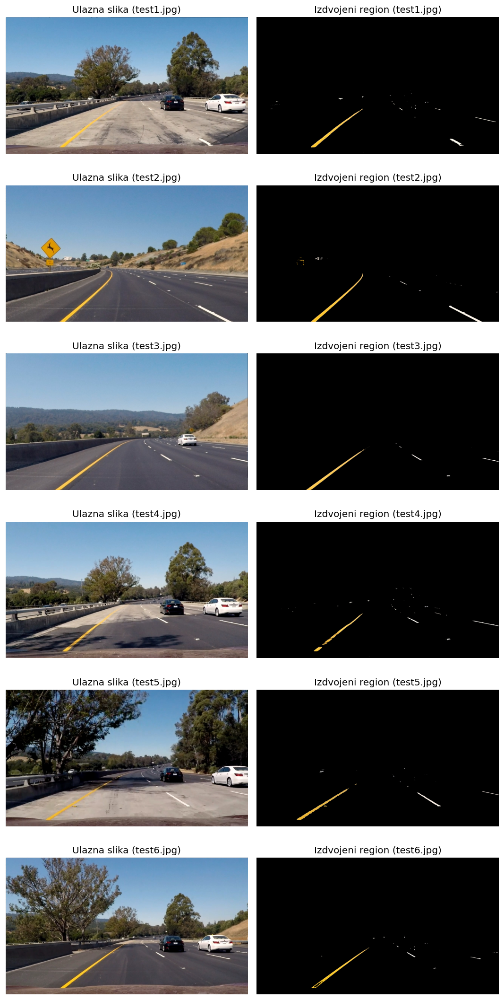

Prosecno vreme izvrsavanja funkcije segment_lanes je 0.80 sekundi


In [4]:
fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(9,18), dpi=120)
ax = axes.ravel()

times = [] # Lista vremena izvršavanja
for i in range(1,7):
    
    # Formiranje naziva slike
    image_name = "test" + str(i) + ".jpg"
    
    # Učitavanje test slike
    image = img_as_float(imread(image_path+image_name))
    
    # Izdvajanje linija i merenje vremena izvršavanja
    start = time.time()
    image_out = segment_lanes(image)
    end = time.time()
    times.append(end-start)
    
    # Prikaz rezultata 
    ax[(i-1)*2].imshow(image)
    ax[(i-1)*2].set_axis_off()
    ax[(i-1)*2].set_title("Ulazna slika ("+image_name+")")    
    ax[(i-1)*2+1].imshow(image_out)
    ax[(i-1)*2+1].set_axis_off()
    ax[(i-1)*2+1].set_title("Izdvojeni region ("+image_name+")")
    
plt.tight_layout()
plt.show()

print("Prosecno vreme izvrsavanja funkcije segment_lanes je %.2f sekundi" %np.mean(times))

# Zadatak 2

## Definisanje pomoćnih funkcija za detekciju ivica Canny algoritmom

In [5]:
def padding(image):
    """
    Opis funkcije:
        Ulazna slika je proširena za jedan piksel sa svih
        strana ponavljanjem ivičnih piksela.
        
    Ulazni argumenti:
        image:
            Slika koju treba proširiti
            
    Izlazni argumenti:
        image_pad:
            Proširena slika
    """
    
    # Uzimanje dimenzija slike
    M, N = image.shape

    # Proširivanje matrice magnitude gradijenta ponavljanjem
    image_pad = np.zeros((M+2, N+2), dtype=type(image[0,0]))
    # Popunjavanje centralnog dela proširene matrice
    image_pad[1:(M+1),1:(N+1)] = image
    # Popunjavanje vrste iznad matrice gradijenta
    image_pad[0,1:(N+1)] = image[0,:]
    # Popunjavanje vrste ispod matrice gradijenta
    image_pad[M+1,1:(N+1)] = image[M-1,:]
    # Popunjavanje kolone levo od matrice gradijenta
    image_pad[1:(M+1),0] = image[:,0]
    # Popunjavanje kolone desno od matrice gradijenta
    image_pad[1:(M+1),N+1] = image[:,N-1]
    # Popunjavanje gornjeg levog piksela
    image_pad[0,0] = image[0,0]
    # Popunjavanje gornjeg desnog piksela
    image_pad[0,-1] = image[0,-1]
    # Popunjavanje donjeg levog piksela
    image_pad[-1,0] = image[-1,0]
    # Popunjavanje donjeg desnog piksela
    image_pad[-1,-1] = image[-1,-1]
    
    return image_pad
    

def non_maximum_suppression(mag, angle):
    """
    Opis funkcije:
        U zavisnosti od dominantnog pravca gradijenta,
        posmatra se susedstvo svakog od piskela i ukoliko
        piksel predstavlja maksimum u lokalnom susedstvu,
        njegova vrednost se zadržava dok se u suprotnom
        on potiskuje (stavlja na 0).
        
    Ulazni argumenti:
        mag:
            Matrica magnitude gradijenta čije lokalne
            ne-maksimume treba potisnuti
        angle:
            Matrica uglova gradijenta
    
    Izlazni argumenti:
        mag_out:
            Dobijena matrica magnitude gradijenta sa
            potisnutim lokalnim ne-maksimumima
    """
    
    # Proširivanje matrice magnitude gradijenta ponavljanjem ivičnih piksela
    mag_pad = padding(mag)

    
    """
    U narednom postupku pravi se 3D niz transliranjem
    magnitude gradijenta po mogućim kvantizovanim pravcima
    ugla gradijenta. Na tako formiranom nizu dimenzija
    (3,M,N), gde su M i N dimenzije matrice magnitude
    gradijenta, vršiće se provera da li je centralni element
    (element matrice magnitude gradijenta) maksimum u lokalnom
    susedstvu i pod uslovom da je pravac dominantan, taj element
    će se sačuvati. Glavni razlog ovakvom pristupu koji jeste
    memorijski zahtevan jeste vremensko ubrzanje koje je
    postignuto izbegavanjem prolaska kroz piksele for petljom.
    """
    
    # Formiranje 3D nizova
    
    # Horizontalna ivica / Ugao gradijenta 0 stepeni
    mag0 = np.array([mag_pad[0:-2,1:-1], mag, mag_pad[2::,1:-1]])
    # Ivica pod uglom od -45 stepeni / Ugao gradijenta 45 stepeni
    mag45 = np.array([mag_pad[0:-2,0:-2], mag, mag_pad[2::,2::]])
    # Vertikalna ivica / Ugao gradijenta 90 stepeni
    mag90 = np.array([mag_pad[1:-1,0:-2], mag, mag_pad[1:-1,2::]])
    # Ivica pod uglom od 45 stepeni / Ugao gradijenta -45/+135 stepeni
    mag135 = np.array([mag_pad[2::,0:-2], mag, mag_pad[0:-2,2::]])

    
    # Potiskivanje lokalnih ne-maksimuma po dominantnim pravcima gradijenta
    mag_out = np.zeros_like(mag)
    
    # Potiskivanje maksimuma za ugao gradijenta 0 stepeni
    mag_out += (mag0[1,:,:] >= mag0[0,:,:]) & (mag0[1,:,:] >= (mag0[2,:,:])) & (angle==0)
    # Potiskivanje maksimuma za ugao gradijenta 45 stepeni
    mag_out += (mag45[1,:,:] >= mag45[0,:,:]) & (mag45[1,:,:] >= (mag45[2,:,:])) & (angle==45)
    # Potiskivanje maksimuma za ugao gradijenta 90 stepeni
    mag_out += (mag90[1,:,:] >= mag90[0,:,:]) & (mag90[1,:,:] >= (mag90[2,:,:])) & (angle==90)
    # Potiskivanje maksimuma za ugao gradijenta 135 stepeni
    mag_out += (mag135[1,:,:] >= mag135[0,:,:]) & (mag135[1,:,:] >= (mag135[2,:,:])) & (angle==-45)
    
    # Izdvajanje maksimalnih vrednosti gradijenta
    mag_out *= mag
    
    return mag_out


def sobel(image):
    """
    Opis funkcije:
        Na ulazni sliku se primenjuje Sobel-ov filtar za
        izdvajanje horizontalnih i vertikalnih ivica.
        Kao rezultat se dobija magnituda gradijenta ulazne
        slike kao i ugao gradijenta.
        
    Ulazni argumenti:
        image:
            Ulazna slika koja se obrađuje
            
    Izlazni argumenti:
        Gx:
            Vertikalni gradijent
        Gy:
            Horizontalni gradijent
        mag:
            Magnituda gradijenta
        angle:
            Ugao gradijenta
    
    """
    
    # Sobelov filtar za izdvajanje horizontalnih ivica
    Hx = np.array([[-1, -2, -1], \
                   [ 0,  0,  0], \
                   [ 1,  2,  1]])

    # Sobelov filtar za izdvajanje vertikalnih ivica
    Hy = np.array([[-1, 0, 1], \
                   [-2, 0, 2], \
                   [-1, 0, 1]])
    
    
    # Izracunavanje vertikalnog i horizontalnog gradijenta slike
    Gx = scipy.ndimage.convolve(image, Hx, mode='mirror')
    Gy = scipy.ndimage.convolve(image, Hy, mode='mirror')
    
    # Magnituda gradijenta
    mag = np.sqrt(np.square(Gx) + np.square(Gy))
    
    # Ugao gradijenta (izbegavanje deljenja nulom)
    Gx_pom = np.copy(Gx)
    Gx_pom[Gx_pom==0] = 1
    angle = np.arctan(np.divide(Gy, Gx_pom))
    angle[(Gx==0) & (Gy>0)] = np.pi/2
    angle[(Gx==0) & (Gy<0)] = -np.pi/2
    angle[(Gx==0) & (Gy==0)] = 0
    
    # Radijani -> Stepeni
    angle *= 180/np.pi
    
    return Gx, Gy, mag, angle


def quantization(angle):
    """
    Opis funkcije:
        Kvantizacija ugla gradijenta.

    Ulazni argumenti:
        angle:
            Matrica ugla gradijenta
    
    Izlazni argumenti:
        angleq:
            Kvantizovani ugao gradijenta
    
    """
    
    angleq = np.copy(angle)
    
    angleq[(angleq < -67.5) | (angleq > 67.5)] = 90
    angleq[(angleq >= -67.5) & (angleq <= -22.5)] = -45
    angleq[(angleq >= 22.5) & (angleq <= 67.5)] = 45
    angleq[(angleq > -22.5) & (angleq < 22.5)] = 0
    
    return angleq


def merge_edges(edge_h, edge_l):
    """
    Opis funkcije:
        Funkcija spaja slabe ivice koje u svom lokalnom
        8-susedstvu imaju ivične piksele koji pripadaju
        jakim ivicama iterativno.
        
    Ulazni argumenti:
        edge_h:
            Matrica jakih ivica
        edge_l:
            Matrica slabih ivica
            
    Izlazni argumenti:
        edges:
            Konačna matrica izdvojenih ivica
    """
    
    # Proširivanje matrice jakih ivica nulama
    M, N = edge_h.shape
    edge_h_pad = np.zeros((M+2, N+2), dtype=bool)
    edge_h_pad[1:-1,1:-1] = edge_h

    while(1):
        # Matrica čiji elementi ukazuju na to da li se u njihovom 8-susedstvu nalaze jake ivice
        strong_neighbors = zeros_like(edge_h)

        # Gornji levi sused
        strong_neighbors |=  edge_h_pad[0:-2,0:-2]
        # Gornji sused
        strong_neighbors |=  edge_h_pad[0:-2,1:-1]
        # Gornji desni sused
        strong_neighbors |=  edge_h_pad[0:-2,2::]
        # Levi sused
        strong_neighbors |= edge_h_pad[1:-1,0:-2]
        # Desni sused
        strong_neighbors |= edge_h_pad[1:-1,2::]
        # Donji levi sused
        strong_neighbors |= edge_h_pad[2::,0:-2]
        # Donji sused
        strong_neighbors |= edge_h_pad[2::,1:-1]
        # Donji desni sused
        strong_neighbors |= edge_h_pad[2::,2::]
        
        # Izdvajanje lokalnih slabih ivica koje poseduju jake ivice u susedstvu
        strong_neighbors &= edge_l
        
        # Anuliranje pridruženih slabih ivica
        edge_l &= ~strong_neighbors
        
        if(np.any(strong_neighbors == True)):
            # Pridruživanje slabih ivica
            edge_h |= strong_neighbors
            edge_h_pad[1:-1,1:-1] = edge_h
        else:
            # Nema vise jakih ivica u susedstvu slabih
            break
            
    return edge_h


# Funkcije za prikaz međurezultata

def imshow2_1(img_in, image):
    
    # Prikaz originalne slike i slike posle primene Gauss-ovog filtra
    fig, axes = plt.subplots(ncols=2, figsize=(12,12), dpi=120)
    ax = axes.ravel()
    ax[0].imshow(img_in, cmap='gray')
    ax[0].set_title("Ulazna slika")
    ax[0].set_axis_off()
    ax[1].imshow(image, cmap='gray')
    ax[1].set_title("Slika nakon primene Gauss-ovog filtra")
    ax[1].set_axis_off()  
    plt.tight_layout()
    plt.show()
    
def imshow2_2(Gx, Gy):
    
    # Prikaz originalne slike i slike posle primene Gauss-ovog filtra
    fig, axes = plt.subplots(ncols=2, figsize=(12,12), dpi=120)
    ax = axes.ravel()
    ax[0].imshow(Gx, cmap='gray')
    ax[0].set_title("Vertikalni gradijent (horizontalne ivice)")
    ax[0].set_axis_off()
    ax[1].imshow(Gy, cmap='gray')
    ax[1].set_title("Horizontalni gradijent (vertikalne ivice)")
    ax[1].set_axis_off()
    plt.tight_layout()
    plt.show()
    
def imshow2_3(mag, angle):
    
    # Prikaz magnitude i ugla gradijenta
    fig, axes = plt.subplots( ncols=2, figsize=(12,12), dpi=120)
    ax = axes.ravel()
    ax[0].imshow(mag, cmap='gray')
    ax[0].set_title("Magnituda gradijenta")
    ax[0].set_axis_off()
    im_angle = ax[1].imshow(angle, cmap='jet')
    ax[1].set_title("Ugao gradijenta")
    ax[1].set_axis_off()
    fig.colorbar(im_angle, ax=ax[1], fraction=0.03, pad=0.04)
    plt.tight_layout()
    plt.show()
    
def imshow2_4(angleq, mag_sup):
    
    # Prikaz kvantizovanog ugla gradijenta i magnitude gradijenta
    # nakon primene potiskivanja lokalnlih ne-maksimuma
    fig, axes = plt.subplots(ncols=2, figsize=(12,12), dpi=120)
    ax = axes.ravel()
    im_angle = ax[0].imshow(angleq, cmap='jet')
    ax[0].set_title("Ugao gradijenta nakon kvantizacije")
    ax[0].set_axis_off()
    fig.colorbar(im_angle, ax=ax[0], fraction=0.03, pad=0.04)
    ax[1].imshow(mag_sup, cmap='gray')
    ax[1].set_title("Magnituda gradijenta posle potiskivanja lokalnih ne-maksimuma")
    ax[1].set_axis_off()
    plt.tight_layout()
    plt.show()
    
def imshow2_5(edge_l, edge_h):
                    
    # Prikaz jakih i slabih ivica
    fig, axes = plt.subplots(ncols=2, figsize=(12,12), dpi=120)
    ax = axes.ravel()
    ax[0].imshow(edge_h, cmap='gray')
    ax[0].set_title("Mapa jakih ivica")
    ax[0].set_axis_off()
    ax[1].imshow(edge_l, cmap='gray')
    ax[1].set_title("Mapa slabih ivica")
    ax[1].set_axis_off()
    plt.tight_layout()
    plt.show()
    
    

## Definicija funkcije 'canny_edge_detection'

In [6]:
def canny_edge_detection(img_in, sigma, threshold_low, threshold_high, show_steps=False):
    """
    Opis funkcije:
        Funkcija 'canny_edge_detection' je zahtevana zadatkom i na
        osnovu prethodno definisanih pomoćnih funkcija moguće je
        kroz korake definisati funkciju za detekciju ivica Canny
        algoritmom. Najpre je izvršeno niskofrekventno filtriranje
        ulazne slike, zatim Sobelovim operatorom određen
        horizontalni i vertikalni gradijent, kvantizacija uglova
        gradijenta i potiskivanje lokalnih ne-maksimuma. Tako
        dobijene ivice se na osnovu ulaznih argumenata funkcije
        dele na slabe i jake ivice i na osnovu pomoćne funkcije
        za spajanje ovih ivica dobija se konačna mapa ivica.
        
    Ulazni argumenti:
        img_in:
            Ulazna grayscale slika
        sigma:
            Standardna devijacija Gauss-ovog filtra pri NF filtriranju
        threshold_low:
            Prag slabih ivica
        threshold_high:
            Prag jakih ivica
        show_steps:
            Bool vrednost za prikaz međurezultata (opcioni argument)
            
    Izlazni argumenti:
        edges:
            Konačna matrica izdvojenih ivica
    """
    
    # Filtriranje Gausovim filtrom
    image = skimage.filters.gaussian(img_in, sigma=sigma, mode='mirror', truncate=3)
    
    # Izračunavanje gradijenta primenom Sobel-ovog filtra
    Gx, Gy, mag, angle = sobel(image)
    
    # Kvantizacija gradijenta
    angleq = quantization(angle)
    
    # Potiskivanje lokalnih ne-maksimuma
    mag_sup = non_maximum_suppression(mag, angleq)
    
    # Određivanje mapa slabih i jakih ivica
    edge_h = mag_sup > threshold_high
    edge_l = (mag_sup < threshold_high) & (mag_sup > threshold_low)
    
    # Spajanje slabih ivica koje u svom 8-lokalnom susedstvu sadrže jake ivice
    edges = merge_edges(edge_h, edge_l)
    
    # Prikaz međurezultata
    if(show_steps):
        imshow2_1(img_in, image)
        imshow2_2(Gx, Gy)
        imshow2_3(mag, angle)
        imshow2_4(angleq, mag_sup)
        imshow2_5(edge_l, edge_h)
    
    return edges

## Prikaz međurezultata Canny algoritma

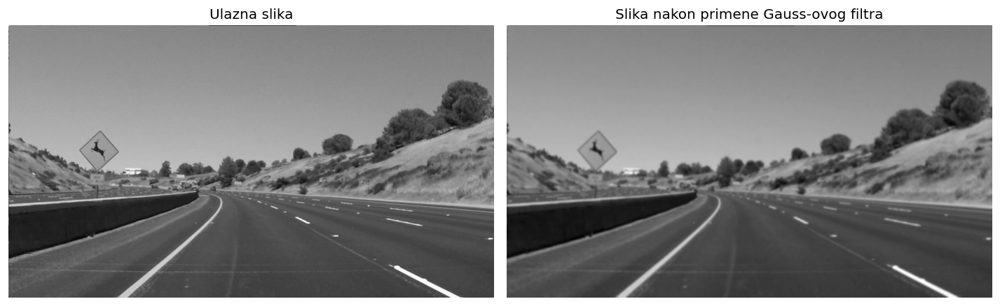

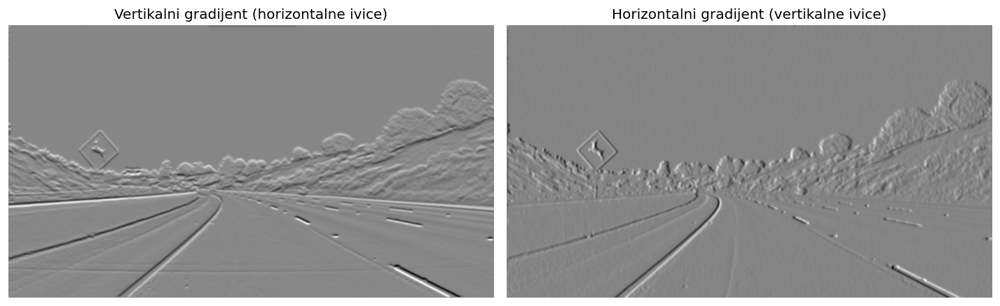

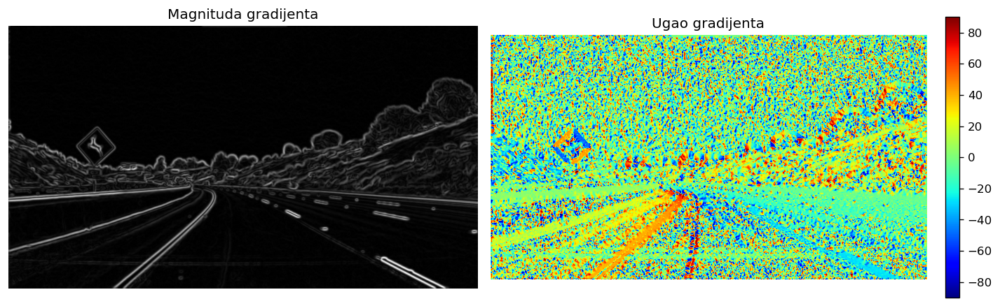

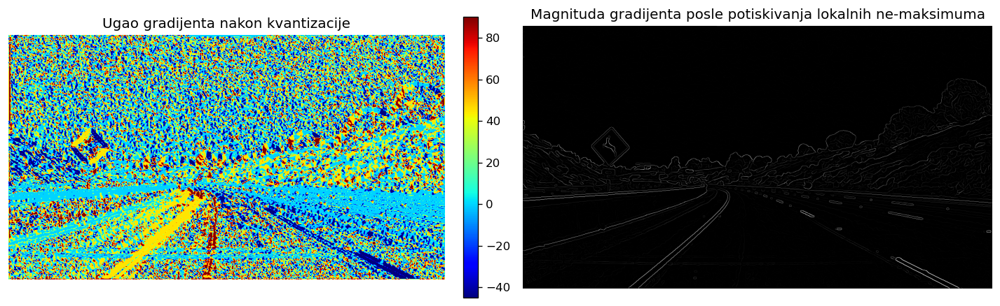

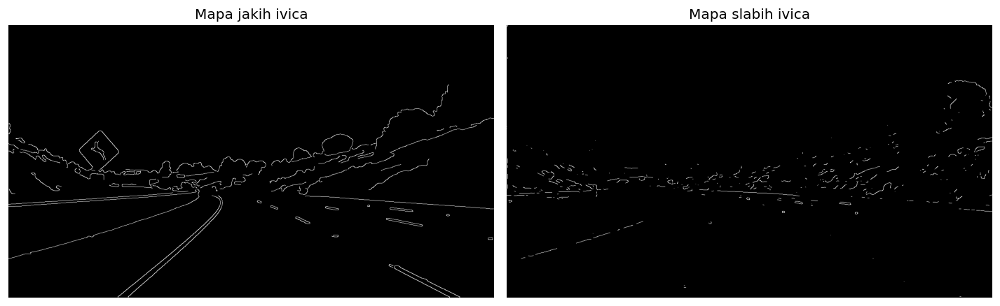

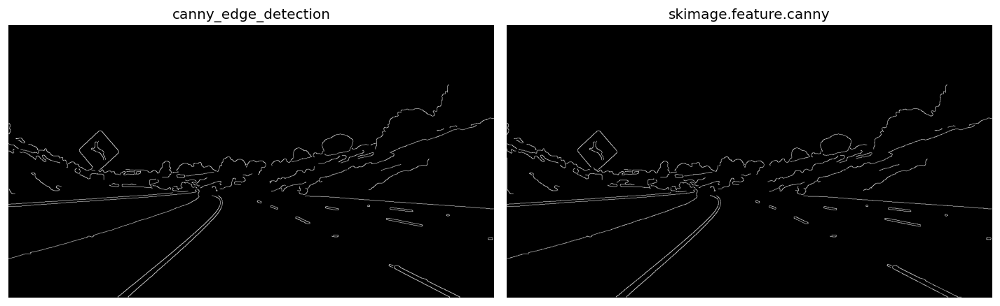

Poklapanje implementiranog algoritma i ugrađenog algoritma je 99.85%


In [7]:
# Učitavanje slike
image = color.rgb2gray(img_as_float(imread(image_path + "test2.jpg")))

# Parametri korišćeni pri pozivu funkcija
sigma = 2
threshold_low = 0.2
threshold_high = 0.4

# Poziv implementirane funkcije
edges = canny_edge_detection(image, sigma, threshold_low, threshold_high, show_steps=True)

# Poziv ugrađene funkcije sa istim parametrima
edgesT = skimage.feature.canny(image, sigma, threshold_low, threshold_high)

# Poređenje dobijenih rezultata sa ugrađenom Canny funkcijom
fig, axes = plt.subplots(ncols=2, figsize=(12,12), dpi=120)
ax = axes.ravel()
ax[0].imshow(edges, cmap='gray')
ax[0].set_title("canny_edge_detection")
ax[0].set_axis_off()
ax[1].imshow(edgesT, cmap='gray')
ax[1].set_title("skimage.feature.canny")
ax[1].set_axis_off()
plt.tight_layout()
plt.show()

print("Poklapanje implementiranog algoritma i ugrađenog algoritma je %.2f%%" %(100*sum(edges==edgesT)/edges.size))

## Testiranje Canny algoritma

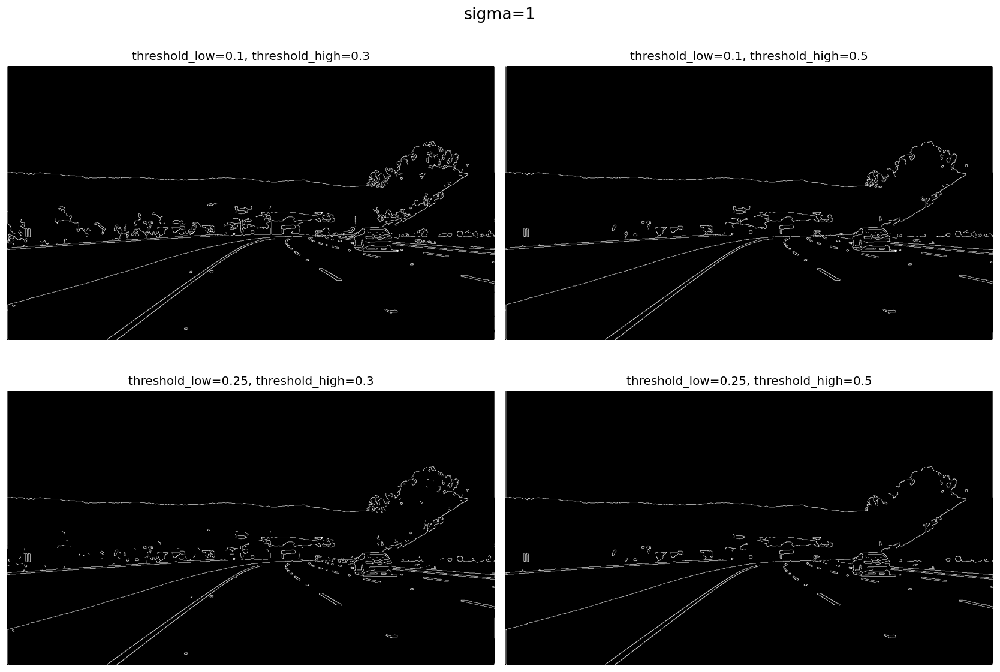

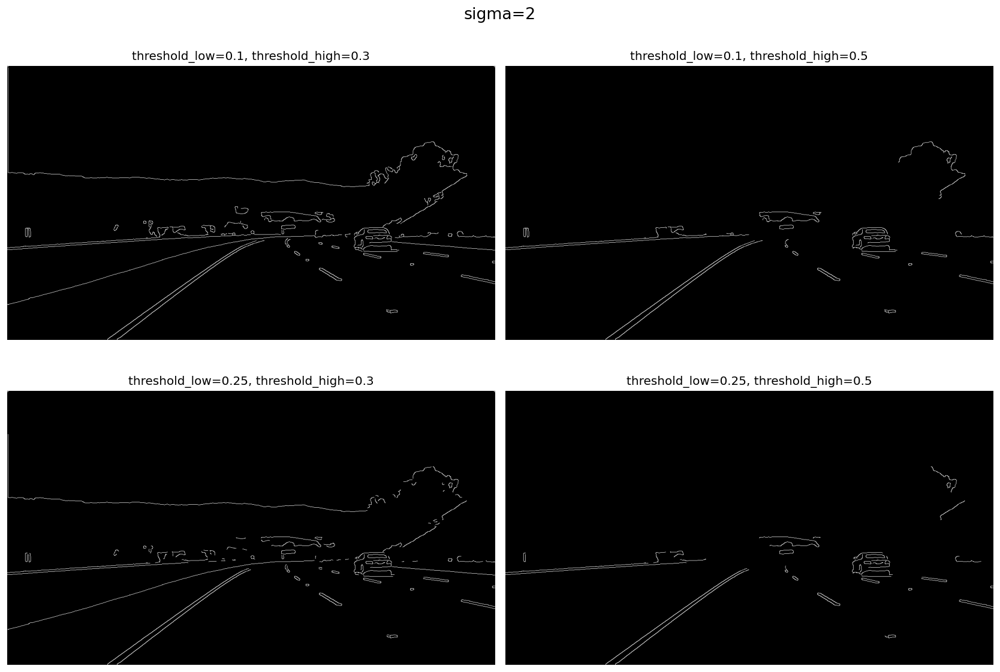

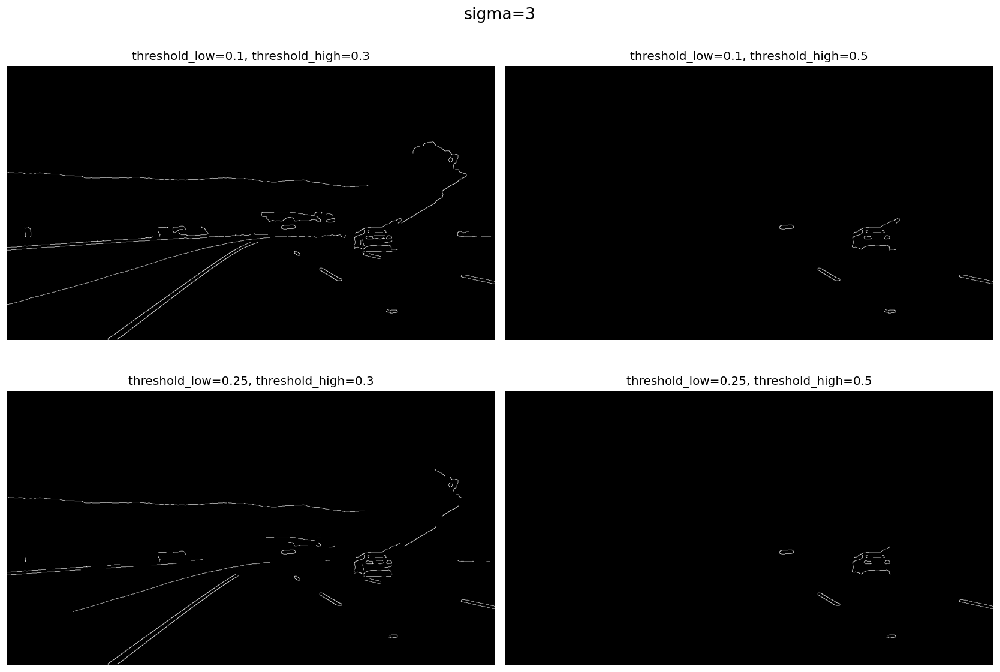

Prosecno vreme izvrsavanja funkcije canny_edge_detection je 1.08 sekundi
Prosecno vreme izvrsavanja funkcije skimage.feature.canny je 0.49 sekundi


In [8]:
# Učitavanje slike
image = color.rgb2gray(img_as_float(imread(image_path + "test3.jpg")))

# Lista za memorisanje vremena izvršavanja
time_vector = []
time_vector_skimage = []

# Standardna devijacija Gauss-ovog filtra
for sigma in [1, 2, 3]:
    
    # Prikaz rezultata
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14,10), dpi=120)
    ax = axes.ravel()
    fig.suptitle("sigma="+str(sigma), fontsize=16)

    itr = 0
    for threshold_low in [0.1, 0.25]:
        for threshold_high in [0.3, 0.5]:
            # Primena Canny algoritma
            start = time.time()
            edges = canny_edge_detection(image, sigma, threshold_low, threshold_high)
            end = time.time()
            time_vector.append(end-start)
            
            # Poziv ugrađene funkcije radi poređenja vremena
            start = time.time()
            edgesT = skimage.feature.canny(image, sigma, threshold_low, threshold_high)
            end = time.time()
            time_vector_skimage.append(end-start)
            
            # Prikaz rezultata
            ax[itr].imshow(edges, cmap='gray')
            ax[itr].set_title("threshold_low="+str(threshold_low)+", threshold_high="+str(threshold_high))
            ax[itr].set_axis_off()
            
            # Inkrementiranje brojača
            itr += 1
        
    plt.tight_layout()
    plt.show()

print("Prosecno vreme izvrsavanja funkcije canny_edge_detection je %.2f sekundi" %np.mean(time_vector))
print("Prosecno vreme izvrsavanja funkcije skimage.feature.canny je %.2f sekundi" %np.mean(time_vector_skimage))

# Zadatak 3

In [9]:
def get_line_segments(img_edges, line, min_size, max_gaps, tolerancy):
    """
    Opis funkcije:
        U opsegu kolona računata je vrednost funkcije prave (vrsta).
        Kako su od interesa samo kolone i vrste u granicama (0,M) i
        (0,N), respektivno, u matrici nula, dimenzija MxN, upisane
        su jedinice na mestima prave (prethodno određene vrste i
        kolone).Takva matrica je proširena dilatacijom u radijusu
        ulaznog parametra 'tolerancy' i logičkom operacijom 'i' sa
        ulaznom slikom ivica, izdvojeni su ivični pikseli koji
        pripadaju pravoj. Kako duži na izdvojenoj pravoj može biti
        više, vrši se prebrojavanje segmenata. Svaki segment čine
        ivični pikseli koji nemaju prekid u lokalnom 8-susedstvu.
        Za svaki od segmenata se posmatraju krajnje leve i krajnje
        desne koordinate i na osnovu njih proverava da li se susedna
        duž nalazi na udaljenosti manjoj od max_gaps, i spajaju se
        ukoliko je uslov ispunjen. Konačno, proverom dužina svakog
        od segmenata proverava se i uslov minimalne dužine duži
        (min_size) i iz funkcije se vraćaju sve duži koje su
        ispunile kriterijume.
        
    Ulazni argumenti:
        img_edges:
            Slika sa detektovanim ivičnim pikselima sa koje se
            detektuju linije
        line:
            Niz od dva elementa (theta, rho) kojim se zadaje
            pravac linije
        min_size:
            Minimalna dužina segmenta (u pikselima) da bi duž
            bila detektovana, sve linije koje su manje od ove
            veličine treba da budu ignorisane
        max_gaps:
            Maksimalne veličine prekida (u pikselima) koje se
            mogu ignorisati prilikom detekcije duži
        tolerancy:
            Radijus okoline u okviru koje se traže ivični pikseli
            
    Izlazni argumenti:
        line_segments:
            Niz detektovanih duži pri čemu je svaka duž predstavljena
            sa koordinatama početne i krajnje tačke duži
    """
    
    # Dimenzije slike
    M, N = img_edges.shape
    
    
    # ----------- Izdvajanje piksela na zadatoj pravoj ------------
    
    # Proširivanje slike nulama
    image_line = np.zeros_like(img_edges)
    
    # Kolone u kojima je moguće naći liniju
    col_vector = np.arange(0,N)
    
    # Vrste u kojima se nalazi prava
    row_vector = (np.round((line[1] - col_vector*np.cos(line[0]))/np.sin(line[0]))).astype(int)
    
    # Izdvajanje indeksa vrsti u opsegu dimenzija ulazne slike
    indexes = ((row_vector>=0) & (row_vector<M))
    
    # Kreiranje binarne maske zadate prave
    image_line[row_vector[indexes], col_vector[indexes]] = 1
    
    # Unošenje tolerancije oko piksela sa vrednošću 1 (okolina disk radijusa tolerancy, operacija dilatacija)
    image_line = binary_dilation(image_line, disk(tolerancy))

    # Operacijom "and" dobijene maske prave i ulazne slike izdvajaju se ulazni pikseli koji pripadaju pravoj
    image_line = (image_line & img_edges)
    
    
    # ------ Segmentacija izdvojenih duži na zadatom pravcu -------

    
    # Vrste i kolone u kojima se nalaze ivični pikseli
    rows = np.any(image_line, axis=1)
    
    # Nizovi indeksa pomoću kojih će se čuvati koordinate
    ind_rows = np.arange(0,M)
    ind_cols = np.arange(0,N)
    
    # Brojač segmenata
    seg_num = 1
    
    # Matrica segmenata
    segment_matrix = np.zeros((M+1,N+2), dtype=int)
    
    # Prolazak kroz sve vrste koje sadrže bar jedan ivični piksel
    for r in ind_rows[rows]:
        # Prolazak kroz sve kolone koje sadrže ivični piksel u trenutnom redu
        for c in ind_cols[image_line[r,:] == 1]:
            # Lista dodeljenih segmenata pikselimo levo, gore-levo, gore i gore-desno
            sur_segments = np.array([segment_matrix[r+1,c], segment_matrix[r,c], \
                                    segment_matrix[r,c+1], segment_matrix[r,c+2]])
            
            sur_segments = sur_segments[sur_segments != 0]

            # Da li je lista okolnih segmenata prazna?
            if(np.size(sur_segments)==0):
                # Ukoliko nema okolnih segmenata, pikselu se dodeljuje novi segment
                segment_matrix[r+1,c+1] = seg_num
                seg_num += 1
            else:
                # Izdvajanje svih okolnih segmenata koji će nakon ovog koraka postati jednaki
                set_of_sur_segments = set(sur_segments)
                # Segment sa minimalnim brojem
                min_seg = min(set_of_sur_segments)
                # Uklanjanje izdvojenog segmenta
                set_of_sur_segments.remove(min_seg)
                # Svakom od preostalih segmenata se dodeljuje vrednost minimalnog
                for seg in set_of_sur_segments:
                    segment_matrix[segment_matrix==seg] = min_seg
                # Trenutni piksel se takođe dodeljuje izdvojenom segmentu
                segment_matrix[r+1,c+1] = min_seg

                
    # Izdvajanje matrice segmenata
    pixels_center = segment_matrix[1::,1:-1]
    
    # Formiranje skupa segmenata
    set_of_segments = set(pixels_center[pixels_center!=0])
    
    # Iterator segmenata se inicijalizuje
    seg_num = 0
    # Za svaki segment, dodeljuje mu se nova vrednost u osegu 0-broj_segmenata
    for element in set_of_segments:
        # Broj trenutnog segmenta
        seg_num += 1
        # Dodeljuje se negativna vrednost kako ne bi došlo do preklapanja
        pixels_center[pixels_center==element] = -seg_num
        
    # Realne vrednosti segmenata se dobijaju negacijom
    pixels_center = -pixels_center
    
    # Čuvanje vrednosti u matricu segmenata
    segment_matrix[1::,1:-1] = pixels_center
    
    
    # ------------------ Izdvajanje početnih i krajnjih koordinata segmenata ---------------
    
    
    # Lista u kojoj će se čuvati izdvojene duži
    lines = []
    
    for seg in range(1,seg_num+1):
        # Lista indeksa koji sadrže trenutni segment
        seg_ind_col = []
        seg_ind_row = []
        
        # Binarna matrica sa jedinicama na mestima elemenata trenutnog segmenta
        current_seg = (segment_matrix[1::,1:-1] == seg)
        
        # Da li segment postji?
        if(current_seg.any()):
            # Indeksi kolona i vrsta koji sadrže trenutni segment
            seg_ind_col = ind_cols[np.sum(current_seg, axis=0) != 0]
            seg_ind_row = ind_rows[np.sum(current_seg, axis=1) != 0] 

            # Koordinate početne i krajnje tačke duži
            xl1 = min(seg_ind_col)
            xl2 = max(seg_ind_col)
            
            # U zavisnosti od znaka ugla nagiba prave, posmatra se minimum ili maksimum
            if(line[0] > 0):
                yl1 = max(seg_ind_row)
                yl2 = min(seg_ind_row)
            else:
                yl1 = min(seg_ind_row)
                yl2 = max(seg_ind_row)

            lines.append([xl1, yl1, xl2, yl2])
            
    
    # --- Ispitivanje uslova maksimalnog prekida i minimalne dužine ---
            
    
    # Sortiranje liste linija tako da xl1 raste
    lines = sorted(lines, key=lambda x: x[0])
    
    
    
    # Da li postoje bar 2 duži koje su ispunile kriterijume?
    if (len(lines) > 1):
        
        # Kriterijum maksimalnog prekida
        i = 0
        while(i < len(lines)-1):
            # Koordinate krajnje tačke na x i y osi trenutne duži
            x1 = lines[i][2]
            y1 = lines[i][3]
             # Koordinate početne tačke na x i y osi naredne duži
            x2 = lines[i+1][0]
            y2 = lines[i+1][1]
            # Računanje Euklidske distance
            gap = np.sqrt((x2-x1)**2 + (y2-y1)**2)
            # Da li je prekid manji od maksimalnog ili se linije preklapaju?
            if((gap < max_gaps) or (x2 <= x1)):
                
                # Trenutna duž se produžuje shodno nagibu prave
                lines[i][2] = max(lines[i][2],lines[i+1][2])
                if(line[0] > 0):
                    lines[i][3] = min(lines[i][3], lines[i+1][3])
                else:
                    lines[i][3] = max(lines[i][3], lines[i+1][3])                  

                # Naredni element liste se briše
                lines.pop(i+1)
                # Ostaje se u istom elementu liste kako bi ispitalo spajanje sa (i+2) elementom
            else:
                i += 1
        
    # Kriterijum minimalne dužine
    i = 0
    while(i < len(lines)):
        # Koordinate duži
        xl1 = lines[i][0]
        yl1 = lines[i][1]
        xl2 = lines[i][2]
        yl2 = lines[i][3]

        # Dužina duži
        line_size = np.sqrt((xl2-xl1)**2 + (yl2-yl1)**2)

        # Da li uslov zadovoljava minimalnu dužinu?
        if(line_size < min_size):
            lines.pop(i)
        else:
            i += 1
             
    return lines

# Zadatak 4

## Definicija pomoćne funkcije 'lane_coordinates' i funkcije 'lane_detection'

In [10]:
def lane_coordinates(edges, side):
    """
    Opis funkcije:
        Funkcija poziva Hafovu transformaciju u zavisnosti od
        strane sa koje treba detektovati liniju (određuje
        opseg ugla prave). Nakon detekcije peak-ova, poziva
        se implementirana funkcija get_line_segments i na
        osnovu generisanih duži, bira se najduža duž i njene
        koordinate se prosleđuju kao izlazni argument.
        
    Ulazni argumenti:
        edges:
            Mapa ivica
        side:
            Izbor strane sa koje se detektuje ivica (leva ili desna)
            
    Izlazni argumenti:
        Koordinate linije
        
    """
    # Deinisanje opsega uglova u kojima se posmatra Hough-ova transformacija
    if(side == 'left'):
        angles = np.linspace(1*np.pi/18,4*np.pi/12,300)
    elif(side == 'right'):
        angles = np.linspace(-4*np.pi/12,-1*np.pi/18,300)
    else:
        raise ValueError("Ulazni argument 'side' uzima vrednosti 'left'/'right'")
       
    # Izdvajanje linija pomoću Hough-ove transformacije
    out, angles, d = hough_line(edges, angles)
    [ints, theta, rho] = hough_line_peaks(out, angles, d, min_distance=1, min_angle=0, num_peaks=3)
    
    # Broj detektovanih linija
    N = len(theta)
    
    # Parametri za detekciju duži
    min_size = 3
    max_gaps = 20
    tolerancy = 5
    
    # Uzimanje koordinata leve duži
    coordinates = []
    for i in range(N):
        line = [theta[i], rho[i]]
        coordinates.extend(get_line_segments(edges, line, min_size, max_gaps, tolerancy))
        
    # Izdvajanje najduže detektovane duži
    size_max = 0
    ind_max = 0

    for i in range(len(coordinates)):
        xl1, yl1, xl2, yl2 = coordinates[i]
        size = np.sqrt((xl2-xl1)**2 + (yl2-yl1)**2)
        if(size > size_max):
            size_max = size
            ind_max = i
            
    # U slučaju da nije detektovana nijedna linija, zbog robusnosti i izbegavanja prekida programa,
    # algoritam vraća koordinate gornjeg levog ugla
    
    lane = []
    if not coordinates:
        lane = [0,0,1,0]
    else:
        lane = coordinates[ind_max]
              
            
    return lane


def lane_detection(image, show_steps=False):
    """
    Opis funkcije:
        Funkcia lane_detection objedinjuje sve dosadašnje korake.
        Najpre se izvršava segmentacija ulazne slike implementiranom
        funkcijom segment_lanes, ivice se izdvajaju funkcijom
        canny_edge_detection i nakon toga, duži se detektuju pozivom
        funkcije lane_coordinates posebnim pozivom za levu i za desnu
        kolovoznu traku.
        
    Ulazni argumenti:
        image:
            Ulazna slika koju treba obraditi
        show_steps:
            Opcioni argument za prikazivanje međurezultata
            
    Izlazni argumenti:
        Lista koja sadrži koordinate duži leve i desne trake
    """
    
    # Lista za memorisanje vremena izvršavanja
    execution_time = []
    
    # Segmentacija traka
    start = time.time()
    segmented_lanes = segment_lanes(image)
    execution_time.append(time.time()-start)

      
    # Parametri potrebni za detekciju ivica
    sigma = 2
    threshold_low = 0.2
    threshold_high = 0.4
    
    # Detekcija ivica na sivoj slici
    start = time.time()
    edges = canny_edge_detection(color.rgb2gray(segmented_lanes), sigma, threshold_low, threshold_high)
    execution_time.append(time.time()-start)
    
    
    # Izdvajanje leve trake
    start = time.time()
    left_lane = lane_coordinates(edges, 'left')
    execution_time.append(time.time()-start)
    

    # Izdvajanje desne trake
    start = time.time()
    right_lane = lane_coordinates(edges, 'right')
    execution_time.append(time.time()-start)

        
    if(show_steps):
        # Prikaz rezultata
        fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12,8), dpi=120)
        ax = axes.ravel()
        ax[0].imshow(image)
        ax[0].set_title("Ulazna slika")
        ax[0].set_axis_off()
        ax[1].imshow(segmented_lanes)
        ax[1].set_title("Rezultat segmentacije")
        ax[1].set_axis_off()
        ax[2].imshow(edges, cmap='gray')
        ax[2].set_title("Detektovane ivice")
        ax[2].set_axis_off()
        image = cv2.line(image,(left_lane[0],left_lane[1]),(left_lane[2],left_lane[3]),(1,0,0),20)
        image = cv2.line(image,(right_lane[0],right_lane[1]),(right_lane[2],right_lane[3]),(1,0,0),20)
        ax[3].imshow(image)
        ax[3].set_title("Rezultat")
        ax[3].set_axis_off()
        plt.tight_layout()
        plt.show()
        
        print("Vreme izvrsavanja segmentacije:            %.2fs" %execution_time[0])
        print("Vreme izvrsavanja detekcije ivica:         %.2fs" %execution_time[1])
        print("Vreme izvrsavanja detekcije leve trake:    %.2fs" %execution_time[2])
        print("Vreme izvrsavanja detekcije desne trake:   %.2fs" %execution_time[3])
        print("Ukupno vreme izvrsavanja:                  %.2fs" %sum(execution_time))
        
    
    return [left_lane, right_lane]


## Testiranje algoritma na test slikama

--------------------------------------------------------------------------------
--------------------- Trenutno posmatrana slika: test1.jpg ---------------------
--------------------------------------------------------------------------------


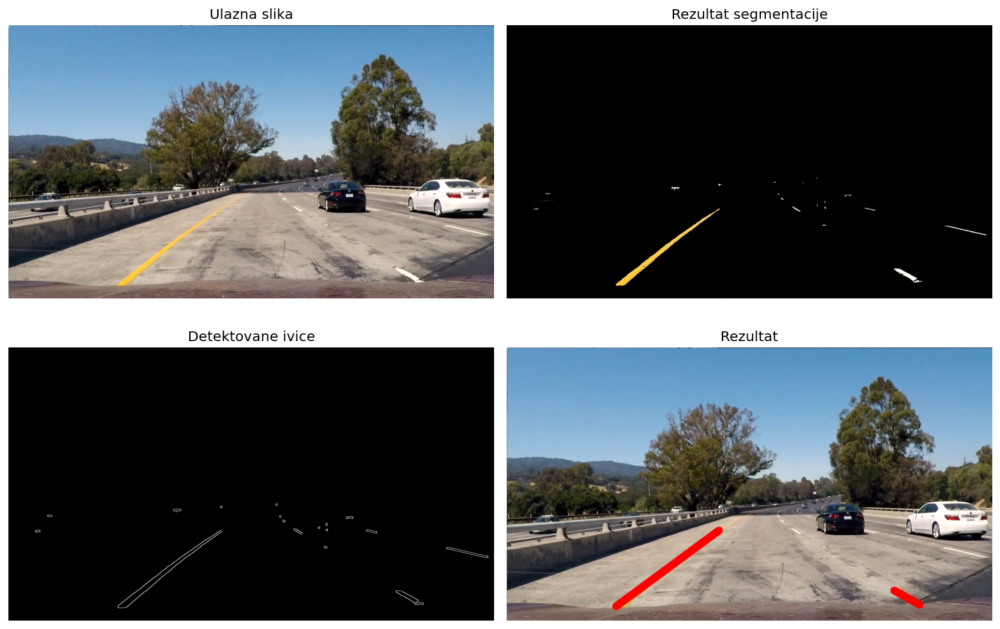

Vreme izvrsavanja segmentacije:            0.91s
Vreme izvrsavanja detekcije ivica:         0.22s
Vreme izvrsavanja detekcije leve trake:    0.58s
Vreme izvrsavanja detekcije desne trake:   0.63s
Ukupno vreme izvrsavanja:                  2.34s
--------------------------------------------------------------------------------
--------------------- Trenutno posmatrana slika: test2.jpg ---------------------
--------------------------------------------------------------------------------


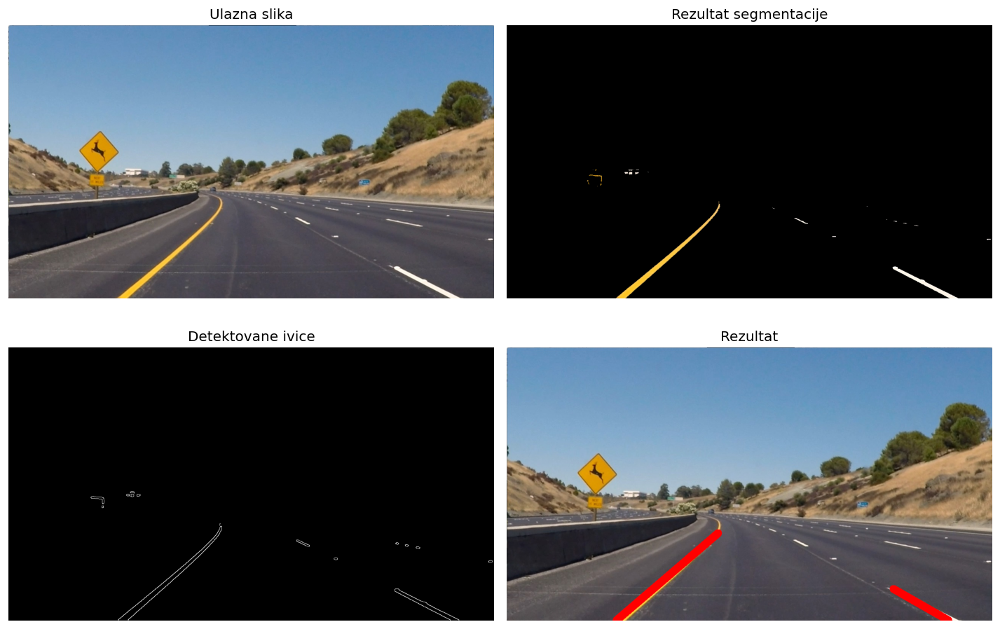

Vreme izvrsavanja segmentacije:            0.58s
Vreme izvrsavanja detekcije ivica:         0.24s
Vreme izvrsavanja detekcije leve trake:    0.63s
Vreme izvrsavanja detekcije desne trake:   0.56s
Ukupno vreme izvrsavanja:                  2.01s
--------------------------------------------------------------------------------
--------------------- Trenutno posmatrana slika: test3.jpg ---------------------
--------------------------------------------------------------------------------


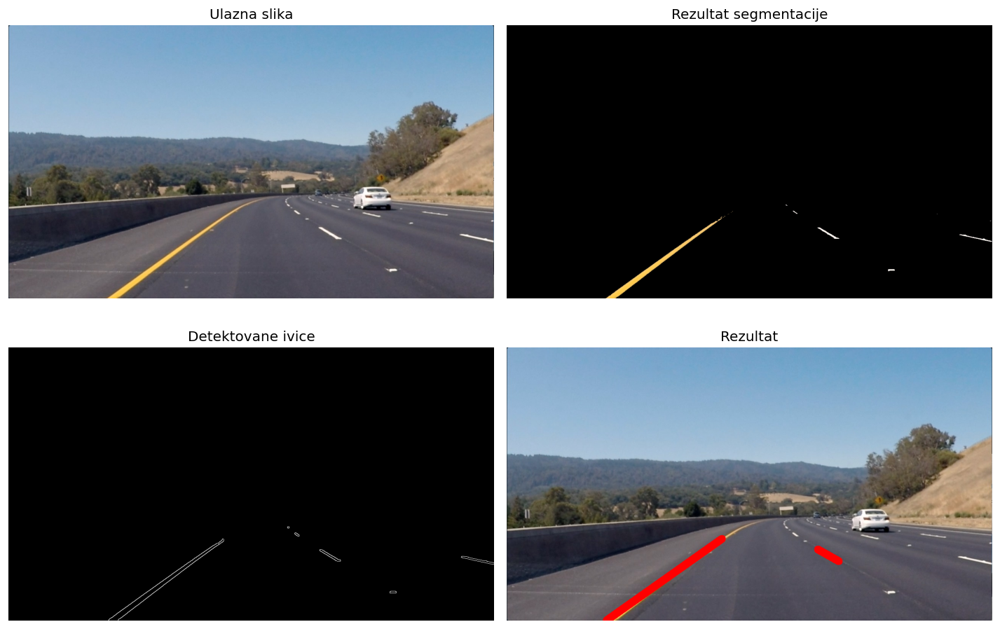

Vreme izvrsavanja segmentacije:            0.54s
Vreme izvrsavanja detekcije ivica:         0.22s
Vreme izvrsavanja detekcije leve trake:    0.73s
Vreme izvrsavanja detekcije desne trake:   0.74s
Ukupno vreme izvrsavanja:                  2.23s
--------------------------------------------------------------------------------
--------------------- Trenutno posmatrana slika: test4.jpg ---------------------
--------------------------------------------------------------------------------


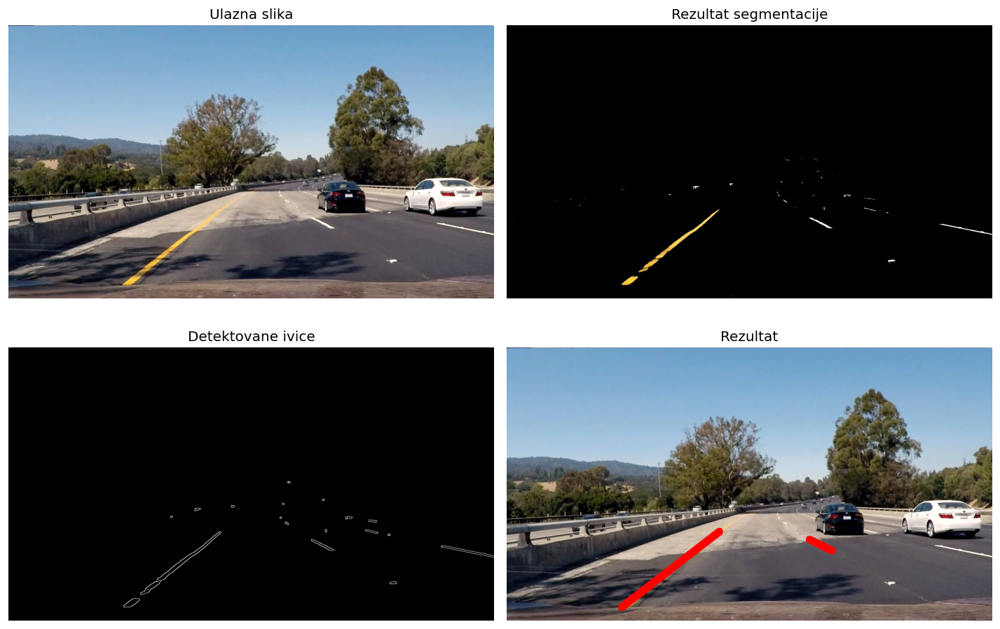

Vreme izvrsavanja segmentacije:            1.24s
Vreme izvrsavanja detekcije ivica:         0.38s
Vreme izvrsavanja detekcije leve trake:    1.00s
Vreme izvrsavanja detekcije desne trake:   0.59s
Ukupno vreme izvrsavanja:                  3.22s
--------------------------------------------------------------------------------
--------------------- Trenutno posmatrana slika: test5.jpg ---------------------
--------------------------------------------------------------------------------


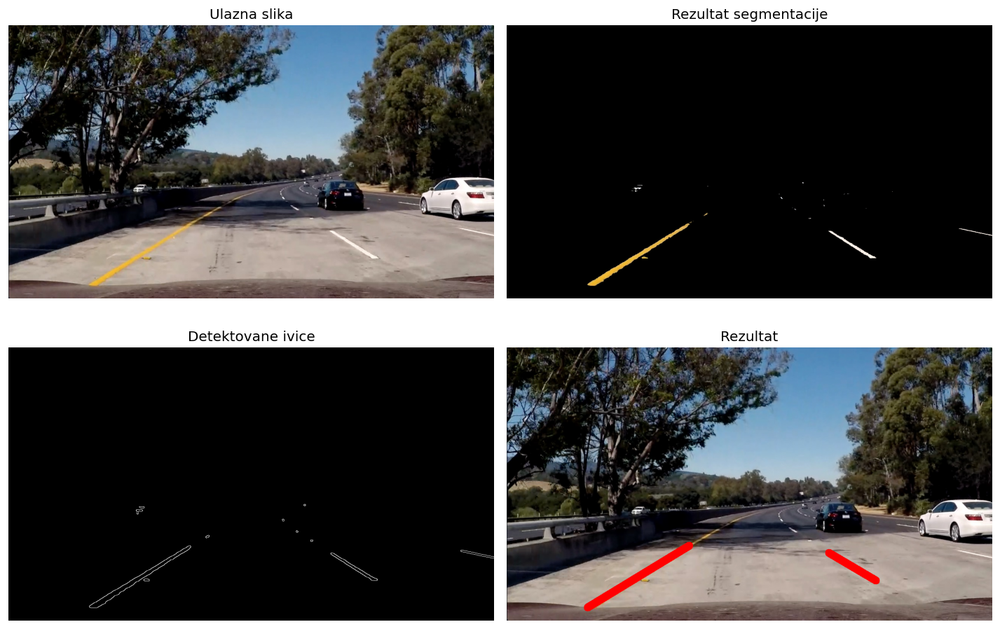

Vreme izvrsavanja segmentacije:            0.96s
Vreme izvrsavanja detekcije ivica:         0.25s
Vreme izvrsavanja detekcije leve trake:    0.67s
Vreme izvrsavanja detekcije desne trake:   0.73s
Ukupno vreme izvrsavanja:                  2.61s
--------------------------------------------------------------------------------
--------------------- Trenutno posmatrana slika: test6.jpg ---------------------
--------------------------------------------------------------------------------


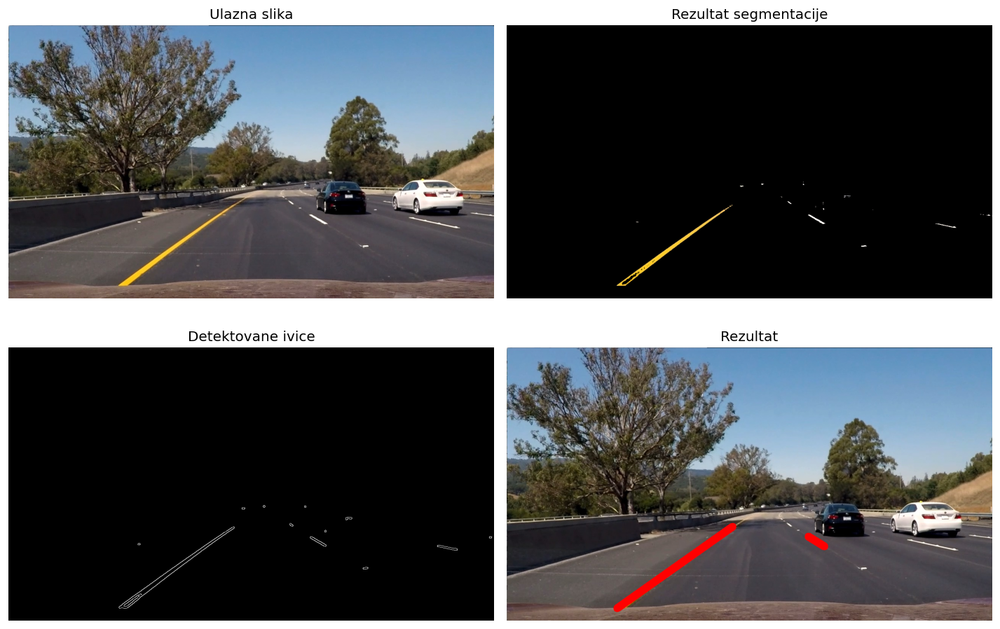

Vreme izvrsavanja segmentacije:            0.83s
Vreme izvrsavanja detekcije ivica:         0.23s
Vreme izvrsavanja detekcije leve trake:    1.24s
Vreme izvrsavanja detekcije desne trake:   0.71s
Ukupno vreme izvrsavanja:                  3.01s


In [11]:
for i in range(1,7):
    
    # Formiranje naziva slike
    image_name = "test" + str(i) + ".jpg"
    print("--------------------------------------------------------------------------------")
    print("--------------------- Trenutno posmatrana slika: " + image_name + " ---------------------")
    print("--------------------------------------------------------------------------------")

    
    # Učitavanje test slike
    image = img_as_float(imread(image_path + "test" + str(i) + ".jpg"))
    
    # Poziv implementirane funkcije sa prikazom međurezultata
    left, right_lane = lane_detection(image, show_steps=True)
     

# Definisanje pomoćnih funkcija za rad sa videom

In [12]:
def extract_frames(video):
    """
    Opis funkcije:
        Funkcija kao ulazni argument uzima naziv videa zajedno
        sa ekstenzijom formata, izdvaja pojedinačne frejmove i
        čuva ih u posebnom folderu.
        
    Ulazni argumenti:
        video:
            Naziv videa sa ekstenzijom formata (primer: "video_road.mp4")
            
    Izlazni argumenti:
        count:
            Broj frejmova u posmatranom videu
        fps:
            Broj frejmova u sekundi
    """
    
    # Izdvajanje imena videa (potrebno za kasnije čuvanje)
    video_name = video.rpartition('.')[0]
    
    # Ime foldera u kojem će se smeštati izdvojeni frejmovi
    frame_path = video_name + "_frames"
    
    # Ukoliko folder ne postoji, folder će se sam kreirati
    if not os.path.exists(frame_path):
        os.makedirs(frame_path)
    
    # Kreiranje video objekta
    vidcap = cv2.VideoCapture(image_path+video)
    
    # Broj frejmova po sekundi
    fps = vidcap.get(cv2.CAP_PROP_FPS)
    
    # Čitanje prvog frejma
    success, image = vidcap.read()
    count = 0 # Brojač frejmova se inicijalizuje
    
    # Dok ima frejmova u videu
    while success:
        
        # Čuvanje izdvojenog frejma
        cv2.imwrite(frame_path + "/frame%d.jpg" % count, image)
        
        # Učitavanje narednog grejma
        success,image = vidcap.read()
        
        # Inkrementiranje brojača
        count += 1
    
    return [count, fps]


def draw_lanes(video, frameID):  
    """
    Opis funkcije:
        Funkcija kao ulazni argument uzima naziv videa zajedno
        sa ekstenzijom formata, kao i broj frejma koji treba
        obraditi. Slika se učitava i vrši detekcija traka pomoću
        implementirane funkcije "lane_detection". Na ulaznoj slici
        se zatim crtaju linije kao rezultat detekcije i tako dobijene
        slike se čuvaju u posebnom folderu.
        
    Ulazni argumenti:
        video:
            Naziv videa sa ekstenzijom formata (primer: "video_road.mp4")
        frameID:
            Broj posmatranog frejma
            
    Izlazni argumenti:
        /
    """
    # Naziv videa
    video_name = video.rpartition('.')[0]
    
    # Ime foldera u kojem će se smeštati izdvojeni frejmovi
    results_folder = video_name + "_results"
    
    # Ukoliko folder ne postoji, folder će se sam kreirati
    if not os.path.exists(results_folder):
        os.makedirs(results_folder)
    
    # Putanja do foldera u kojem se nalaze frejmovi
    frame_path = video_name + "_frames/"
    
    # Putanja do foldera za smeštanje rezultata
    result_path = video_name + "_results/"
    
    # Učitavanje slike
    image = img_as_float(imread(frame_path + "frame%d.jpg" % frameID))
    
    # Obrada trenutnog frejma
    left, right = lane_detection(image, False)
    
    # Crtanje linija na slici
    image = cv2.line(image,(left[0],left[1]),(left[2],left[3]),(1,0,0),15)
    image = cv2.line(image,(right[0],right[1]),(right[2],right[3]),(1,0,0),15)
    
    # Konverzija neophodna za čuvanje slike
    image = image.astype(np.float32)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    
    # Čuvanje rezultata
    cv2.imwrite(result_path + "frame%d.jpg" % frameID, 255*image)
    
    
def save_video(video, Nframes, fps):
    """
    Opis funkcije:
        Funkcija kao ulazni argument uzima naziv videa zajedno
        sa ekstenzijom formata, broj frejmova u videu kao i broj
        frejmova u sekundi. Na osnovu već izvršene obrade, slike
        se spajaju u jedan video u kojem su na svakoj slici označene
        detektovane kolovozne trake.
        
    Ulazni argumenti:
        video:
            Naziv videa sa ekstenzijom formata (primer: "video_road.mp4")
        Nframes:
            Broj frejmova koje treba obraditi
        fps:
            Broj frejmova po sekundi
            
    Izlazni argumenti:
        /
    """
    
    # Naziv videa
    video_name = video.rpartition('.')[0]
    
    # Putanja do foldera u kojem su smešteni rezultati obrade
    result_path = video_name + "_results/"
    
    out = None
    for i in range(0, Nframes):

        # Učitavanje slike
        image = cv2.imread(result_path + "frame%d.jpg" % i)

        # Ukoliko nije kreiran video objekat, on se kreira
        if not out:
            # Dimenzije slike
            height, width, channels = image.shape
            # Kreiranje objekta za čuvanje videa
            fourcc = cv2.VideoWriter_fourcc(*'mp4v')
            out = cv2.VideoWriter(video_name + "_lanes.mp4", fourcc, fps, (width, height))

        # Upis slike u video
        out.write(image)

    # Kraj upisa
    out and out.release()
    cv2.destroyAllWindows()
    

def video_lane_detection(video):
    """
    Opis funkcije:
        Ideja ove funkcije jeste objedinjavanje prethodnih pomoćnih funkcija i kreiranje
        univerzalne funkcije pomoću koje se mogu samo na osnovu naziva videa izdvojiti
        frejmovi, pojedinačno obraditi svaki frejm i sačuvati u video formatu.
        
    Ulazni argumenti:
        video:
            Naziv videa sa ekstenzijom formata (primer: "video_road.mp4")
            
    Izlazni argumenti:
        /
    """
    
    # Izdvajanje frejmova
    Nframes, fps = extract_frames(video)
    
    # Pojedinačna obrada svakog frejma
    for frameID in range(0, Nframes):
        draw_lanes(video, frameID)
            
    # Čuvanje obrađenih frejmova u jedinstven video
    save_video(video, Nframes, fps)

# Obrada videa "video_road.mp4"

In [13]:
start = time.time()
video_lane_detection("video_road.mp4")
end = time.time()

t = end-start
h = t//3600
m = (t%3600)//60
s = t%60

print("Vreme izvrsavanja: %.2d:%.2d:%.2d [sati:minuti:sekundi]" %(h, m, s))

Vreme izvrsavanja: 00:49:42 [sati:minuti:sekundi]
